# Veri Setini Yükleme ve Keşfetme
#### 📚 Gerekli Kütüphanelerin Yüklenmesi

Bu projede derin öğrenme tabanlı bir **CNN modeli** geliştirmek için birçok kütüphane kullanıyoruz:

- **os, pathlib, json** → Dosya yönetimi ve veri okuma
- **numpy, pandas** → Sayısal işlemler ve veri analizi
- **matplotlib, seaborn** → Görselleştirme
- **PIL, cv2** → Görüntü işleme
- **albumentations, torchvision.transforms** → Data augmentation (rotation, flip, zoom, color jitter vb.)
- **PyTorch (torch, nn, optim, DataLoader)** → Modelin tanımlanması, eğitilmesi ve optimize edilmesi
- **Keras ImageDataGenerator** → Alternatif veri artırma yöntemi (opsiyonel)

Bu bölümdeki kütüphaneler, proje boyunca:
1. **Veri önişleme**  
2. **Veri artırma (augmentation)**  
3. **Model geliştirme ve eğitme**  
4. **Sonuçların görselleştirilmesi**  

aşamalarında kullanılacaktır.


**TorchCAM**, PyTorch modelleri üzerinde **Class Activation Map (CAM)** ve Grad-CAM görselleştirmeleri yapmak için kullanılır.  
- `--quiet` parametresi, kurulum sırasında konsolda gereksiz çıktıların görünmesini engeller.

Kurulum sonrası, eğitimli CNN modelimiz üzerinde **hangi bölgelerin sınıflandırma kararını etkilediğini** görselleştirmek için TorchCAM kullandık.


In [1]:
!pip install torchcam --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 54.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 57.4 MB/s eta 0:00:00


In [2]:
import os
from pathlib import Path
import warnings
import random
import json
from collections import Counter, defaultdict
from statistics import mean

import numpy as np
import pandas as pd
import math

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageDraw
import cv2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import torchvision.models as models

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from torchvision.transforms import ToPILImage
from torchcam.methods import GradCAM
from torchcam.utils import overlay_mask

import yaml

warnings.filterwarnings('ignore')


2025-09-26 15:31:17.702693: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758900678.050128      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758900678.146324      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


#### Veri Seti Keşfi (EDA)

Bu bölümde **VisDrone** veri setini tanıyoruz:

1. **Dataset Klasör Yapısı**  
   - `images/` → Eğitim görselleri  
   - `annotations/` → Her görsel için nesne anotasyonları (bounding box + sınıf)  
   - `VisDrone.yaml` → Sınıf bilgilerini içeren dosya  

2. **Sınıf Bilgileri**  
   `VisDrone.yaml` dosyasında yer alan sınıf isimleri okunarak modele verilecek etiketler belirlendi.

3. **Eğitim Seti Boyutu**  
   - Görsel sayısı  
   - Anotasyon dosyası sayısı  

4. **Örnek Görseller**  
   Veri setinden 5 görsel seçilerek görselleştirilmiştir. Bu sayede verinin genel yapısı hakkında fikir sahibi olunur.  

5. **Örnek Anotasyon**  
   Bir anotasyon dosyası açılarak ilk 5 satır incelenmiştir. Anotasyon formatı:  x, y, width, height, score, class_id

6. **Sınıf Dağılımı**  
Tüm anotasyon dosyaları okunarak sınıflara ait nesne sayıları hesaplanmıştır.  
Bu dağılım **barplot** ile görselleştirilmiştir.  

 Bu adım, veri setinde **dengesizlik (class imbalance)** olup olmadığını anlamak için kritik öneme sahiptir.



 Sınıf Bilgileri: {0: 'pedestrian', 1: 'people', 2: 'bicycle', 3: 'car', 4: 'van', 5: 'truck', 6: 'tricycle', 7: 'awning-tricycle', 8: 'bus', 9: 'motor'}
Eğitim Görsel Sayısı: 6471
 Eğitim Anotasyon Sayısı: 6471


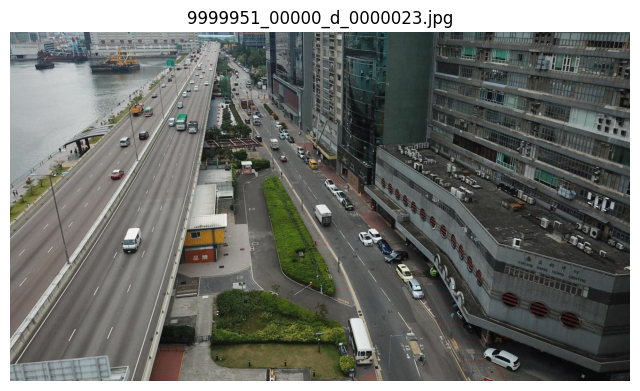

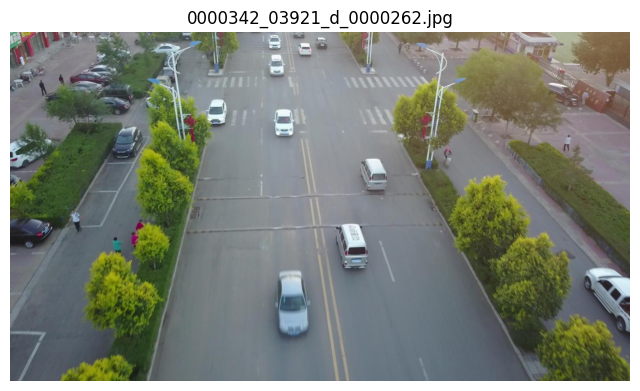

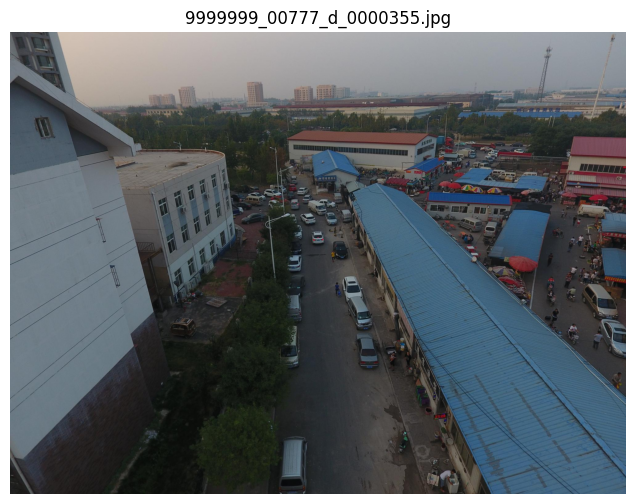

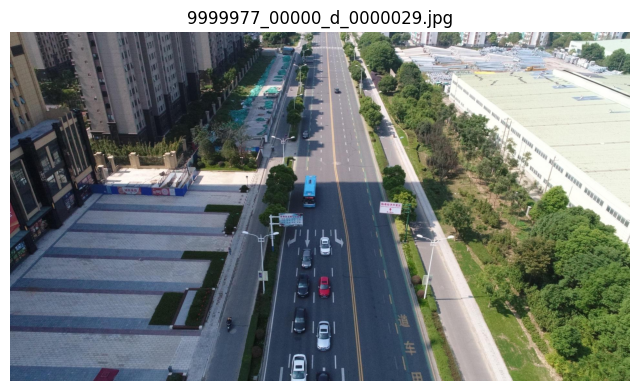

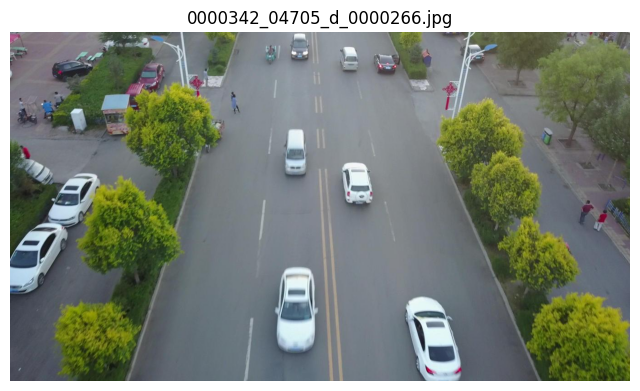

 Örnek Anotasyon (0000325_04801_d_0000686.txt):
84,250,53,36,1,4,0,0
279,166,41,60,1,6,0,0
472,231,16,27,1,1,0,0
398,507,97,180,1,6,0,0
561,489,48,71,1,4,0,0


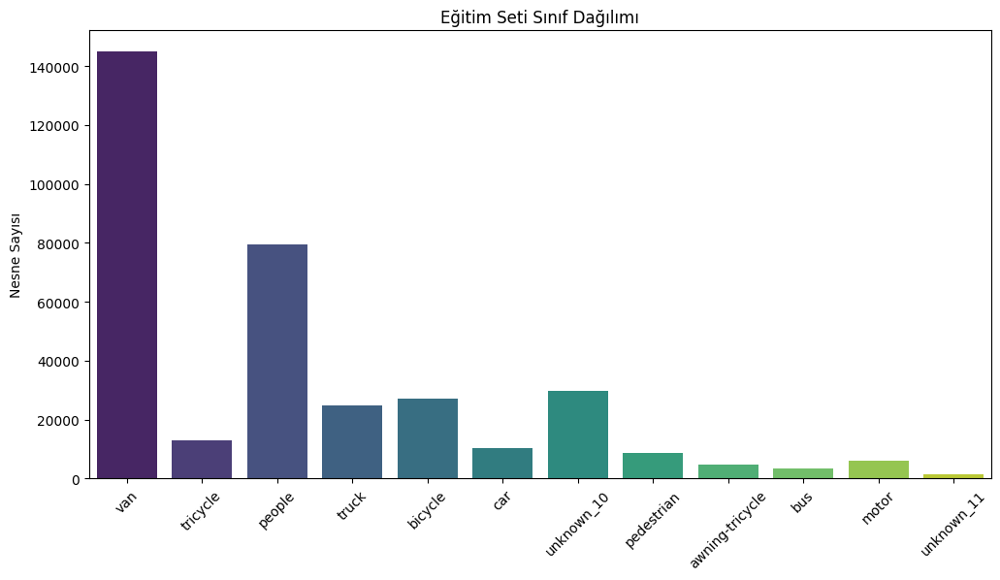

In [3]:
dataset_path = "/kaggle/input/visdrone-dataset"

# Alt klasörleri listeleyelim
os.listdir(dataset_path)

#yaml dosyasını görmek için
yaml_path = os.path.join(dataset_path, "VisDrone.yaml")

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

classes = data["names"]
print(" Sınıf Bilgileri:", classes)

#Eğitim Seti Boyutu ve Örnek Görseller
train_img_dir = os.path.join(dataset_path, "/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images")
train_ann_dir = os.path.join(dataset_path, "/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations")

print("Eğitim Görsel Sayısı:", len(os.listdir(train_img_dir)))
print(" Eğitim Anotasyon Sayısı:", len(os.listdir(train_ann_dir)))

# 5 örnek görsel
sample_imgs = os.listdir(train_img_dir)[:5]

for img_file in sample_imgs:
    img_path = os.path.join(train_img_dir, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8,6))
    plt.imshow(img)
    plt.title(img_file)
    plt.axis("off")
    plt.show()

#annotations
# Bir anotasyon dosyasını açalım
example_ann = os.listdir(train_ann_dir)[0]
ann_path = os.path.join(train_ann_dir, example_ann)

print(f" Örnek Anotasyon ({example_ann}):")
with open(ann_path, "r") as f:
    lines = f.readlines()
    for line in lines[:5]:
        print(line.strip())

#sınıf dağılımı 
class_counter = Counter()

for ann_file in os.listdir(train_ann_dir):
    with open(os.path.join(train_ann_dir, ann_file), "r") as f:
        for line in f.readlines():
            parts = line.strip().split(",")
            if len(parts) >= 6:
                class_id = int(parts[5])
                class_counter[class_id] += 1

# Görselleştirme
class_names = [classes.get(i, f"unknown_{i}") for i in class_counter.keys()]
counts = [class_counter[i] for i in class_counter.keys()]

plt.figure(figsize=(12,6))
sns.barplot(x=class_names, y=counts, palette="viridis")
plt.title("Eğitim Seti Sınıf Dağılımı")
plt.xticks(rotation=45)
plt.ylabel("Nesne Sayısı")
plt.show()


####  Anotasyon Dosyalarının İncelenmesi

Bu adımda, eğitim setinde bulunan anotasyon (etiketleme) dosyaları incelenmiştir:

- `annotations/` klasöründen **ilk 5 anotasyon dosyası** seçildi.
- Her dosya açılarak **ilk 5 satırı** ekrana yazdırıldı.

 **Amaç:**  
Anotasyonların formatını kontrol etmek ve veri etiketlemesinin doğru şekilde yapılmış olduğunu doğrulamaktır.  
Anotasyon dosyasının formatı:
- **x, y** → Bounding box sol üst köşe koordinatları  
- **width, height** → Nesnenin boyutları  
- **score** → Güven skoru (bazı dosyalarda sabit olabilir)  
- **class_id** → Nesne sınıfı (VisDrone sınıfları `VisDrone.yaml` dosyasından alınır)  

Bu inceleme sayesinde model eğitimi öncesinde verinin doğru yapıda olduğu teyit edilmiş olur.

In [4]:
# Anotasyon klasörü
ann_dir = '/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations'
ann_files = os.listdir(ann_dir)[:5]  # İlk 5 anotasyon dosyası

for ann_file in ann_files:
    ann_path = os.path.join(ann_dir, ann_file)
    print(f"\n{ann_file} içeriği:")
    with open(ann_path, 'r') as f:
        lines = f.readlines()
        # İlk 5 satırı göster
        for line in lines[:5]:
            print(line.strip())



0000325_04801_d_0000686.txt içeriği:
84,250,53,36,1,4,0,0
279,166,41,60,1,6,0,0
472,231,16,27,1,1,0,0
398,507,97,180,1,6,0,0
561,489,48,71,1,4,0,0

0000348_02157_d_0000417.txt içeriği:
234,358,17,37,1,1,0,0
248,377,11,22,1,1,0,0
650,149,11,20,1,1,0,0
533,177,8,24,1,1,0,0
522,187,8,26,1,1,0,0

0000260_04159_d_0000118.txt içeriği:
657,10,65,35,0,0,0,0
140,656,228,75,1,4,0,2
673,675,77,90,1,4,1,0
839,642,72,109,1,4,0,0
1135,715,25,50,1,1,1,0

9999985_00000_d_0000024.txt içeriği:
267,100,11,9,1,4,0,0
280,69,8,7,1,4,0,1
277,106,5,9,1,10,0,0
332,233,21,10,1,4,0,1
295,130,34,23,1,5,0,1

9999966_00000_d_0000137.txt içeriği:
239,770,92,93,1,1,0,0
1202,924,109,87,1,1,0,0
1256,872,65,94,1,2,0,1
1203,897,156,72,1,3,0,2
299,343,65,76,1,2,0,2


#### YAML Dosyasının İncelenmesi

Bu adımda, **`VisDrone.yaml`** dosyası okunarak ekrana yazdırılmıştır.  
Bu dosya, veri setinde kullanılan sınıfların bilgilerini içerir.

 **Neden önemli?**  
- `class_id` ile eşleştirilen nesne adlarını öğrenmemizi sağlar.  
- Modelin eğitimi sırasında hangi ID’nin hangi sınıfa ait olduğunu bu dosya üzerinden kontrol ederiz.  
- Örneğin:  
  ```yaml
  names:
    0: pedestrian
    1: people
    2: bicycle
    3: car
    ...

- Bu sayede anotasyon dosyalarındaki class_id değerleri, insan tarafından okunabilir sınıf isimleri ile eşleştirilebilir.

In [5]:
with open('/kaggle/input/visdrone-dataset/VisDrone.yaml') as f:
    data = yaml.safe_load(f)

print(data)


{'path': '../datasets/VisDrone', 'train': 'VisDrone2019-DET-train/images', 'val': 'VisDrone2019-DET-val/images', 'test': 'VisDrone2019-DET-test-dev/images', 'names': {0: 'pedestrian', 1: 'people', 2: 'bicycle', 3: 'car', 4: 'van', 5: 'truck', 6: 'tricycle', 7: 'awning-tricycle', 8: 'bus', 9: 'motor'}, 'download': 'import os\nfrom pathlib import Path\n\nfrom ultralytics.utils.downloads import download\n\ndef visdrone2yolo(dir):\n    from PIL import Image\n    from tqdm import tqdm\n\n    def convert_box(size, box):\n        # Convert VisDrone box to YOLO xywh box\n        dw = 1. / size[0]\n        dh = 1. / size[1]\n        return (box[0] + box[2] / 2) * dw, (box[1] + box[3] / 2) * dh, box[2] * dw, box[3] * dh\n\n    (dir / \'labels\').mkdir(parents=True, exist_ok=True)  # make labels directory\n    pbar = tqdm((dir / \'annotations\').glob(\'*.txt\'), desc=f\'Converting {dir}\')\n    for f in pbar:\n        img_size = Image.open((dir / \'images\' / f.name).with_suffix(\'.jpg\')).size\n

#### Eğitim Seti Sınıf Dağılımı

Bu bölümde, eğitim setindeki tüm anotasyon dosyaları okunarak **sınıf etiketlerinin dağılımı** hesaplanmıştır:

1. **Sınıf Bilgilerinin Alınması**  
   - `VisDrone.yaml` dosyasından sınıf isimleri (`names`) okundu.  
   - Anotasyon dosyalarındaki `class_id` değerleri bu isimlerle eşleştirildi.  

2. **Etiketlerin Sayılması**  
   - Tüm anotasyon dosyaları `Counter` ile tarandı.  
   - Her sınıf için kaç adet nesne bulunduğu hesaplandı.  

3. **Histogram Görselleştirme**  
   - Sınıflara ait nesne sayıları çubuk grafik (bar plot) ile görselleştirildi.  
   - Bu grafik sayesinde hangi sınıfların **daha fazla** veya **daha az** örneğe sahip olduğu kolayca görülebilir.  

Eğer sınıflar arasında büyük bir dengesizlik varsa (**class imbalance**), model eğitimi sırasında bu durum performansı olumsuz etkileyebilir.  
Bu kod bloğu **Data augmentation** , **Weighted loss function** gibi uygulamaları kullanmalı mıyız? sorusuna cevap niteliğindedir

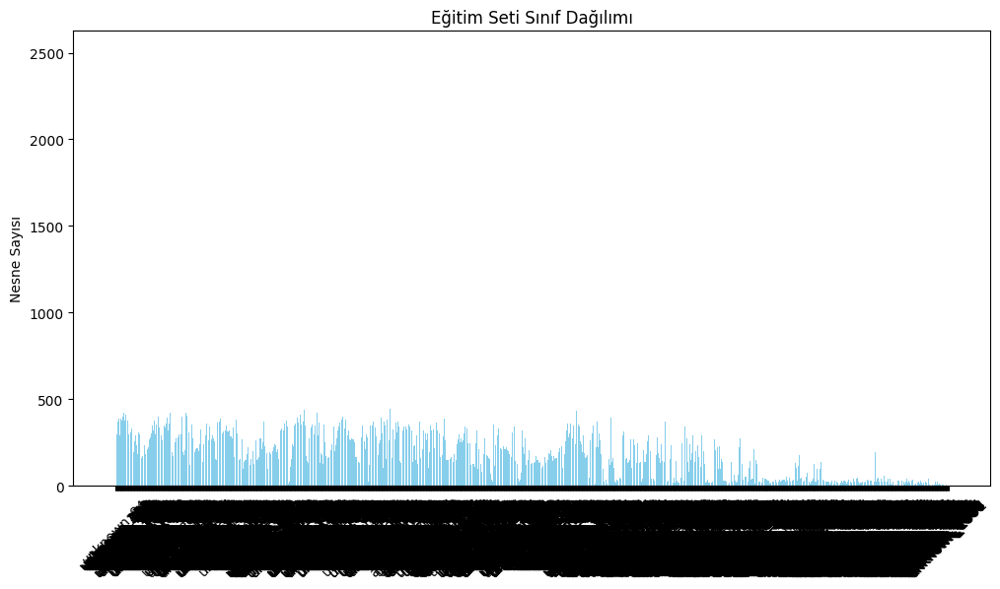

In [6]:
# YAML'den sınıf isimlerini oku
with open('/kaggle/input/visdrone-dataset/VisDrone.yaml') as f:
    data = yaml.safe_load(f)
classes = data['names']

# Anotasyon klasörü
ann_dir = '/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations'
ann_files = os.listdir(ann_dir)

# Tüm sınıf etiketlerini saymak için Counter
class_counter = Counter()

for ann_file in ann_files:
    ann_path = os.path.join(ann_dir, ann_file)
    with open(ann_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.strip().split(',')[0])  # class_id ilk değer
            class_counter[class_id] += 1

# Histogram görselleştirme
class_names = []
counts = []

for class_id, count in class_counter.items():
    class_name = data['names'].get(class_id, f'unknown_{class_id}')
    class_names.append(class_name)
    counts.append(count)

import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.bar(class_names, counts, color='skyblue')
plt.xticks(rotation=45)
plt.title("Eğitim Seti Sınıf Dağılımı")
plt.ylabel("Nesne Sayısı")
plt.show()



#### Görsel Boyutlarının Analizi

Bu adımda, eğitim setindeki görsellerin boyutları incelenmiştir.  
Amaç, model eğitimi öncesinde **görsellerin çözünürlük yapısını anlamak** ve uygun giriş boyutunu seçmektir.

- **Örnekleme:** Veri seti çok büyük olduğundan yalnızca ilk **100 görsel** analiz edilmiştir.
- **Ölçülen değerler:**
  - Ortalama genişlik: **~1550 px**
  - Ortalama yükseklik: **~1007 px**
  - Maksimum boyut: **2000×1500 px**
  - Minimum boyut: **960×540 px**

 **Sonuç:**
- Görseller farklı çözünürlüklere sahip olduğundan, model eğitimi için standart bir boyuta dönüştürmek gerekir.  
- Genellikle **224×224**, **416×416** veya **640×640** gibi giriş boyutları seçilir.  
- Bu seçim yapılırken:
  - **Hesaplama gücü (GPU bellek)**  
  - **Nesnelerin boyutları ve detay kaybı**  
  dikkate alınmalıdır.


In [7]:
train_img_dir = '/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images'
img_files = os.listdir(train_img_dir)

widths = []
heights = []

for img_file in img_files[:100]:  # örnek 100 resim, tüm set büyükse
    img_path = os.path.join(train_img_dir, img_file)
    img = cv2.imread(img_path)
    if img is not None:
        h, w = img.shape[:2]
        widths.append(w)
        heights.append(h)

print(f"Ortalama genişlik: {mean(widths):.2f}, Ortalama yükseklik: {mean(heights):.2f}")
print(f"Maks genişlik: {max(widths)}, Maks yükseklik: {max(heights)}")
print(f"Min genişlik: {min(widths)}, Min yükseklik: {min(heights)}")


Ortalama genişlik: 1549.58, Ortalama yükseklik: 1007.11
Maks genişlik: 2000, Maks yükseklik: 1500
Min genişlik: 960, Min yükseklik: 540


#### Veri Kalite Kontrolü (Bozuk Görseller)

Bu adımda, eğitim setindeki tüm görseller kontrol edilmiştir:

- **Amaç:** Dataset içerisinde bozuk (okunamayan) dosya olup olmadığını tespit etmek.  
- **Yöntem:** Her görsel `cv2.imread()` ile okunmaya çalışılmış, `None` dönen dosyalar "bozuk" olarak kaydedilmiştir.  
- **Sonuç:**  Bozuk / okunamayan görüntü sayısı: 0
- Veri setindeki görsellerin tamamı sorunsuz okunabiliyor.  Bu nedenle ek bir temizlik (data cleaning) işlemine gerek yok.

In [8]:
broken_imgs = []

for img_file in img_files:
    img_path = os.path.join(train_img_dir, img_file)
    img = cv2.imread(img_path)
    if img is None:
        broken_imgs.append(img_file)

print(f"Bozuk / okunamayan görüntü sayısı: {len(broken_imgs)}")


Bozuk / okunamayan görüntü sayısı: 0


#### Anotasyonların Görselleştirilmesi (Bounding Box)

Bu adımda, eğitim setinden seçilen **3 örnek görsel** üzerine, anotasyon dosyalarında verilen **bounding box** koordinatları çizdirilmiştir.  

- **İşlem Adımları:**
  1. Her görsel için karşılık gelen `.txt` anotasyon dosyası okundu.  
  2. Anotasyon dosyalarındaki koordinatlar (`x, y, w, h, score, class_id`) çıkarıldı.  
  3. Görseller üzerinde **dikdörtgen kutular** çizildi.  
  4. Her kutunun üzerine, `VisDrone.yaml` dosyasından alınan **sınıf ismi** yazıldı.  

- **Amaç:**
  - Modelin hangi nesneleri öğreneceğini **görselleştirmek**  
  - **Eksik veya hatalı anotasyon** olup olmadığını hızlıca tespit etmek  
 
Bu görselleştirme sayesinde dataset’in anotasyonlarının **doğru ve tutarlı** olduğu kontrol edilebilir.  
Eğer kutular yanlış yerdeyse → anotasyon hatası vardır.  
Eğer sınıf isimleri doğru değilse → `class_id` eşleşmeleri gözden geçirilmelidir.


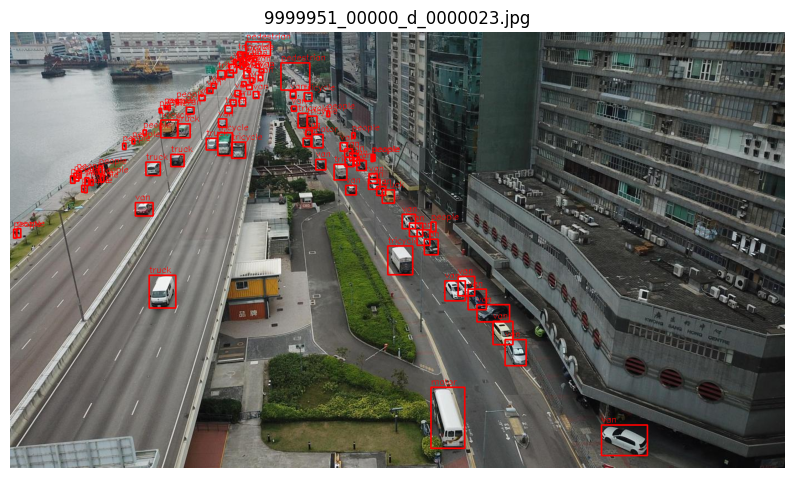

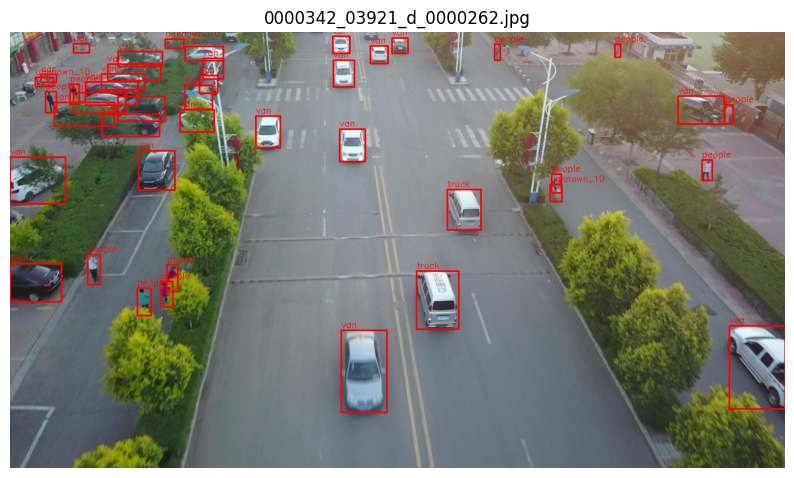

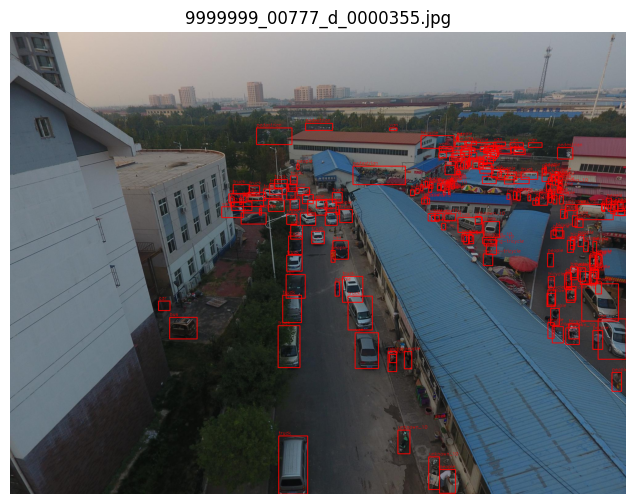

In [9]:
ann_dir = '/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations'

# 3 örnek görselleştirme
example_files = img_files[:3]

for img_file in example_files:
    img_path = os.path.join(train_img_dir, img_file)
    ann_path = os.path.join(ann_dir, img_file.replace('.jpg', '.txt'))  # anotasyon dosyası

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Bounding box çizimi
    if os.path.exists(ann_path):
        with open(ann_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split(',')
                x_min, y_min, w, h = map(int, parts[:4])
                class_id = int(parts[5])
                class_name = data['names'].get(class_id, f'unknown_{class_id}')
                
                # Rectangle çiz
                cv2.rectangle(img, (x_min, y_min), (x_min+w, y_min+h), (255,0,0), 2)
                cv2.putText(img, class_name, (x_min, y_min-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)

    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.title(img_file)
    plt.axis('off')
    plt.show()


# Veri Ön İşleme ve Veri Artırma

Bu bilgiler:
  - **Histogram** oluştururken (sınıf dağılımını görmek için)  
  - **Bounding box görselleştirmelerinde** (kutuların üstüne doğru sınıf ismini yazmak için)  
  kullanılır.  

 **Amaç:**  
Anotasyon dosyalarında geçen `class_id` değerlerini, **anlamlı sınıf isimleri** ile eşleştirerek hem analiz hem de görselleştirmeyi kolaylaştırmak.

In [10]:
# Veri seti bilgisi
yaml_path = '/kaggle/input/visdrone-dataset/VisDrone.yaml'

with open(yaml_path) as f:
    data = yaml.safe_load(f)

classes = data['names']
print("Sınıflar:", classes)


Sınıflar: {0: 'pedestrian', 1: 'people', 2: 'bicycle', 3: 'car', 4: 'van', 5: 'truck', 6: 'tricycle', 7: 'awning-tricycle', 8: 'bus', 9: 'motor'}


### Eğitim Seti Sınıf Dağılımı Analizi

Bu hücrede, **VisDrone veri setindeki eğitim görüntülerinin sınıf dağılımını** analiz ediyoruz. Amaç, hangi nesne sınıfının kaç adet olduğunu görselleştirerek veri dengesini anlamaktır.

#### Adımlar:

1. `train_ann_dir` ve `train_img_dir` ile **eğitim anotasyonları ve görüntülerin bulunduğu dizinler** tanımlandı.
2. `Counter` kullanılarak tüm anotasyon dosyalarındaki **sınıf etiketleri sayıldı**.
   - Anotasyon dosyalarındaki her satır, bir nesneye ait bilgiyi içerir.
   - Satırdaki 6. sütun (`line.strip().split(',')[5]`) sınıf ID'sini temsil eder.
3. Sınıf ID'leri, `data['names']` sözlüğünden okunarak **anlamlı isimlere dönüştürüldü**.
4. `matplotlib` ile sınıf sayıları bir **bar grafiği** olarak görselleştirildi.

Grafikte, her bir sınıfın eğitim setinde kaç kez geçtiğini kolayca görebiliriz. Bu, model eğitimi öncesi veri dengesizliğini ve olası augmentation ihtiyaçlarını belirlemek için önemli bir adımdır.



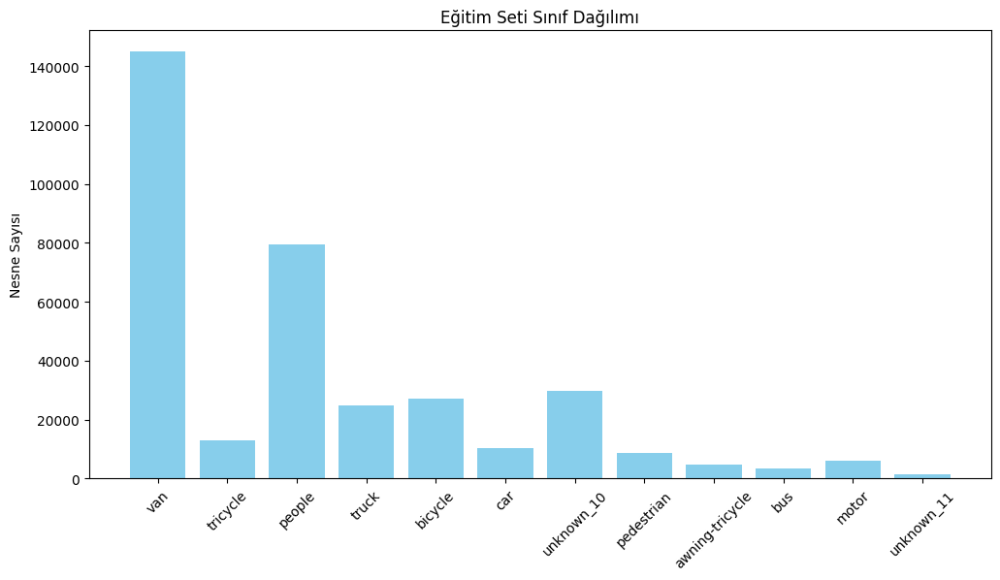

In [11]:
train_ann_dir = '/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations'
train_img_dir = '/kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images'

# Tüm sınıf etiketlerini say
class_counter = Counter()
for ann_file in os.listdir(train_ann_dir):
    ann_path = os.path.join(train_ann_dir, ann_file)
    with open(ann_path, 'r') as f:
        for line in f.readlines():
            class_id = int(line.strip().split(',')[5])
            class_counter[class_id] += 1

# Histogram
class_names = [data['names'].get(i, f'unknown_{i}') for i in class_counter.keys()]
counts = [class_counter[i] for i in class_counter.keys()]

plt.figure(figsize=(12,6))
plt.bar(class_names, counts, color='skyblue')
plt.xticks(rotation=45)
plt.title("Eğitim Seti Sınıf Dağılımı")
plt.ylabel("Nesne Sayısı")
plt.show()


### VisDrone Veri Seti Analizi ve Önişleme

Bu hücre, **VisDrone veri seti** üzerinde kapsamlı bir analiz ve önişleme sürecini gerçekleştirir. Hem görselleştirme hem de veri artırma (augmentation) adımlarını içerir.

#### 1. Görsel Ayarlar ve Sınıf Tanımları
- `matplotlib` ve `seaborn` ile grafiklerin görünümü düzenlendi.
- `VISDRONE_CLASSES` ve `CLASS_COLORS` sözlükleri ile **sınıf isimleri ve renkleri** belirlendi.

#### 2. `VisDroneDatasetAnalyzer` Sınıfı
Bu sınıf veri setini analiz etmek için geliştirilmiştir:
- **load_annotation:** Her bir anotasyon dosyasını güvenli şekilde parse eder ve sınıf bilgilerini çıkarır.
- **analyze_dataset:** Eğitim, doğrulama ve test setlerinin istatistiklerini toplar.
  - Görüntü ve anotasyon sayısı
  - Sınıf dağılımı
  - Ortalama nesne sayısı
  - Görüntü boyutları
- **visualize_class_distribution:** Her subset için sınıf dağılımını bar grafiği olarak görselleştirir.
- **visualize_image_statistics:** Görüntü genişlik, yükseklik ve subset bazlı nesne/görüntü istatistiklerini gösterir.
- **visualize_sample_images:** Rastgele seçilen görüntüler üzerinde bounding box ve sınıf isimlerini görselleştirir.

#### 3. `VisDroneDataAugmentation` Sınıfı
Veri setinde modelin daha iyi genelleme yapabilmesi için **Albumentations tabanlı augmentasyonlar** uygulanır:
- `basic_transform` ve `advanced_transform` ile farklı augmentasyon pipeline'ları tanımlandı:
  - Flip, Rotate, Brightness/Contrast, Hue/Saturation, Blur, Noise, Fog, SunFlare gibi dönüşümler
- `apply_augmentation`: Görüntü ve bounding box'lar üzerinde augmentasyon uygular.
- `visualize_augmentations`: Örnek bir görüntü üzerinde augmentasyonları görselleştirir.

#### 4. Ana Akış
1. Dataset analiz edilir ve istatistikler çıkarılır.
2. Sınıf dağılımı ve görüntü istatistikleri görselleştirilir.
3. Rastgele seçilen birkaç eğitim görüntüsü örnek olarak gösterilir.
4. Örnek bir görüntü üzerinde augmentasyon pipeline'ları uygulanarak etkisi incelenir.

Bu yapı sayesinde:
- Veri setinin genel durumu hızlıca anlaşılır.
- Dengesiz sınıflar veya farklı boyutlu görüntüler tespit edilir.
- Augmentation ile modelin genelleme kapasitesi artırılabilir.

 VisDrone Dataset Veri Önişleme
 Dataset Analizi Başlıyor...

TRAIN Set:
   Görüntü sayısı: 6,471
   Annotation sayısı: 6,471

VAL Set:
   Görüntü sayısı: 548
   Annotation sayısı: 548

TEST Set:
   Görüntü sayısı: 1,610
   Annotation sayısı: 1,610


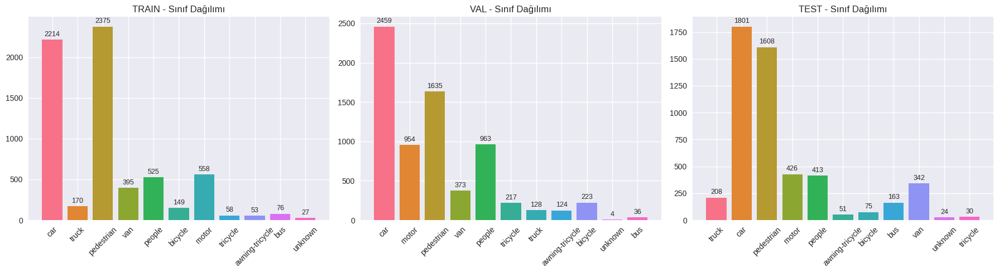

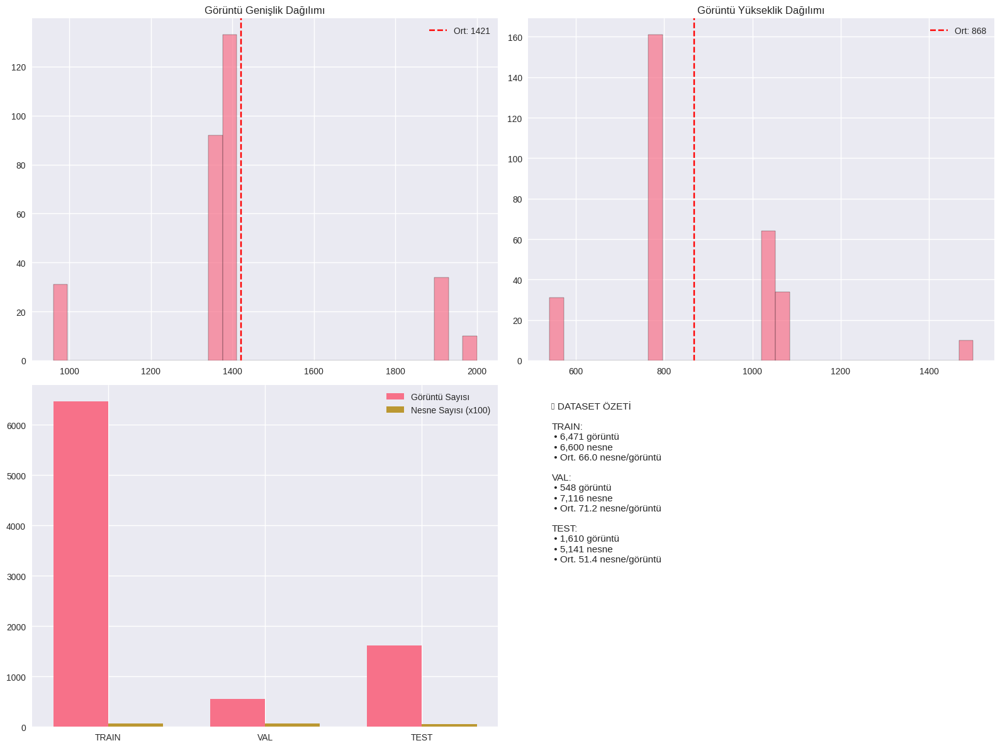

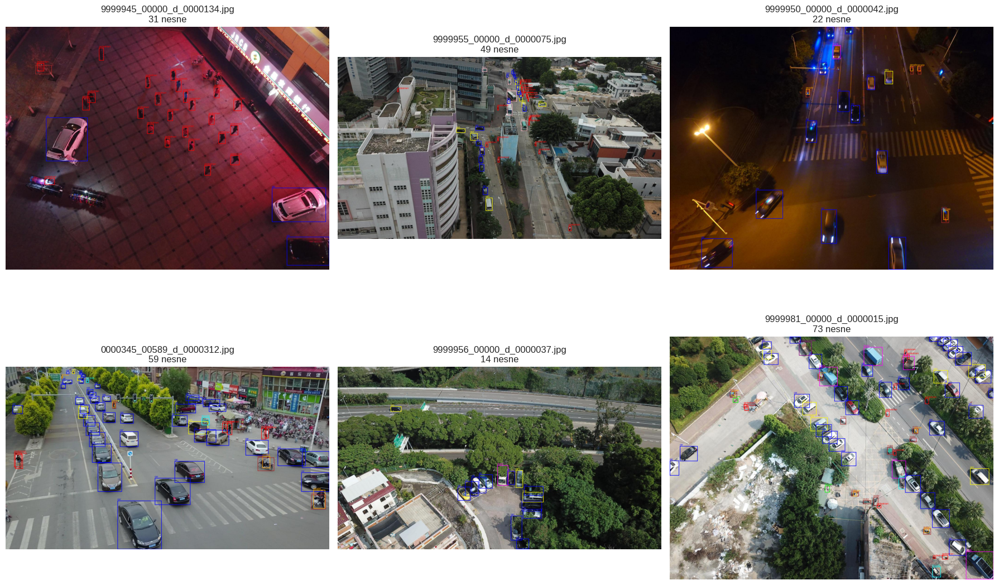

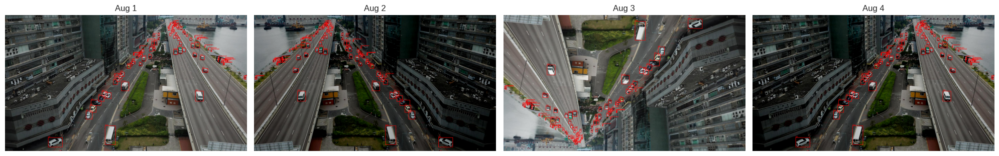


 Veri önişleme ve analiz tamamlandı!


In [12]:
# görsel ayarlamalar
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print(" VisDrone Dataset Veri Önişleme")
print("=" * 60)

# sınıflar
VISDRONE_CLASSES = {
    0: 'ignored regions',
    1: 'pedestrian',
    2: 'people',
    3: 'bicycle',
    4: 'car',
    5: 'van',
    6: 'truck',
    7: 'tricycle',
    8: 'awning-tricycle',
    9: 'bus',
    10: 'motor'
}

CLASS_COLORS = {
    0: (128, 128, 128),
    1: (255, 0, 0),
    2: (255, 165, 0),
    3: (0, 255, 0),
    4: (0, 0, 255),
    5: (255, 255, 0),
    6: (255, 0, 255),
    7: (0, 255, 255),
    8: (128, 0, 128),
    9: (255, 192, 203),
    10: (165, 42, 42)
}

# ---- Analyzer sınıfı ----
class VisDroneDatasetAnalyzer:
    """VisDrone dataset analizi ve önişleme sınıfı"""
    def __init__(self, base_path):
        self.base_path = Path(base_path)
        self.dataset_stats = {}
        self.subsets = {
            "train": {
                "images": self.base_path / "VisDrone2019-DET-train" / "VisDrone2019-DET-train" / "images",
                "annotations": self.base_path / "VisDrone2019-DET-train" / "VisDrone2019-DET-train" / "annotations"
            },
            "val": {
                "images": self.base_path / "VisDrone2019-DET-val" / "VisDrone2019-DET-val" / "images",
                "annotations": self.base_path / "VisDrone2019-DET-val" / "VisDrone2019-DET-val" / "annotations"
            },
            "test": {
                "images": self.base_path / "VisDrone2019-DET-test-dev" / "VisDrone2019-DET-test-dev" / "images",
                "annotations": self.base_path / "VisDrone2019-DET-test-dev" / "VisDrone2019-DET-test-dev" / "annotations"
            }
        }

    def load_annotation(self, annotation_file):
        """VisDrone annotation formatını güvenli şekilde parse eder"""
        annotations = []
        ann_path = Path(annotation_file)
        if not ann_path.exists():
            return annotations

        with ann_path.open('r') as f:
            for line in f:
                s = line.strip()
                if not s:
                    continue
                parts = s.split(',')
                if len(parts) >= 6:
                    try:
                        x = int(float(parts[0])); y = int(float(parts[1]))
                        w = int(float(parts[2])); h = int(float(parts[3]))
                        class_id = int(float(parts[5]))
                    except Exception:
                        continue
                    if class_id > 0:
                        annotations.append({
                            'bbox': [x, y, w, h],
                            'class_id': class_id,
                            'class_name': VISDRONE_CLASSES.get(class_id, 'unknown')
                        })
        return annotations

    def analyze_dataset(self, max_ann_files_per_subset=100):
        """Dataset'in genel analizini yapar (her subset için max N annotation dosyası okuyacak)"""
        print(" Dataset Analizi Başlıyor...")
        stats = {}

        for subset, paths in self.subsets.items():
            img_dir = Path(paths["images"])
            ann_dir = Path(paths["annotations"])

            if not img_dir.exists() or not ann_dir.exists():
                print(f" {subset} klasörü bulunamadı veya eksik: images={img_dir.exists()}, annotations={ann_dir.exists()}")
                continue

            image_files = list(img_dir.glob('*.jpg'))
            annotation_files = list(ann_dir.glob('*.txt'))

            print(f"\n{subset.upper()} Set:")
            print(f"   Görüntü sayısı: {len(image_files):,}")
            print(f"   Annotation sayısı: {len(annotation_files):,}")

            class_counts = Counter()
            total_objects = 0
            image_sizes = []
            objects_per_image = []

            for ann_file in annotation_files[:max_ann_files_per_subset]:
                annotations = self.load_annotation(ann_file)
                objects_per_image.append(len(annotations))
                total_objects += len(annotations)

                for ann in annotations:
                    class_counts[ann['class_name']] += 1

                img_file = img_dir / (ann_file.stem + '.jpg')
                if img_file.exists():
                    try:
                        with Image.open(img_file) as img:
                            image_sizes.append(img.size)
                    except Exception:
                        pass

            stats[subset] = {
                'image_count': len(image_files),
                'annotation_count': len(annotation_files),
                'class_distribution': dict(class_counts),
                'total_objects': total_objects,
                'avg_objects_per_image': float(np.mean(objects_per_image)) if objects_per_image else 0.0,
                'image_sizes': image_sizes
            }

        self.dataset_stats = stats
        return stats

    def visualize_class_distribution(self):
        subsets = list(self.subsets.keys())
        fig, axes = plt.subplots(1, len(subsets), figsize=(6 * len(subsets), 5))
        if len(subsets) == 1:
            axes = [axes]

        for idx, subset in enumerate(subsets):
            if subset not in self.dataset_stats:
                axes[idx].axis('off')
                continue

            class_dist = self.dataset_stats[subset]['class_distribution']
            if not class_dist:
                axes[idx].axis('off')
                continue

            classes = list(class_dist.keys())
            counts = list(class_dist.values())
            bars = axes[idx].bar(classes, counts, color=sns.color_palette("husl", len(classes)))
            axes[idx].set_title(f'{subset.upper()} - Sınıf Dağılımı')
            axes[idx].tick_params(axis='x', rotation=45)
            for bar, count in zip(bars, counts):
                axes[idx].text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(counts)*0.01,
                               str(count), ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

    def visualize_image_statistics(self):
        all_widths, all_heights = [], []
        subsets_present = []
        for subset in self.subsets:
            if subset in self.dataset_stats and self.dataset_stats[subset]['image_sizes']:
                sizes = self.dataset_stats[subset]['image_sizes']
                widths = [s[0] for s in sizes]
                heights = [s[1] for s in sizes]
                all_widths.extend(widths)
                all_heights.extend(heights)
                subsets_present.append(subset.upper())

        if not all_widths or not all_heights:
            print(" Yeterli görüntü boyutu bilgisi yok.")
            return

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes[0, 0].hist(all_widths, bins=30, edgecolor='black', alpha=0.7)
        axes[0, 0].set_title('Görüntü Genişlik Dağılımı')
        axes[0, 0].axvline(np.mean(all_widths), color='red', linestyle='--', label=f'Ort: {np.mean(all_widths):.0f}')
        axes[0, 0].legend()

        axes[0, 1].hist(all_heights, bins=30, edgecolor='black', alpha=0.7)
        axes[0, 1].set_title('Görüntü Yükseklik Dağılımı')
        axes[0, 1].axvline(np.mean(all_heights), color='red', linestyle='--', label=f'Ort: {np.mean(all_heights):.0f}')
        axes[0, 1].legend()

        subsets_list, image_counts, object_counts = [], [], []
        for subset in self.subsets:
            if subset in self.dataset_stats:
                subsets_list.append(subset.upper())
                image_counts.append(self.dataset_stats[subset]['image_count'])
                object_counts.append(self.dataset_stats[subset]['total_objects'])

        x = np.arange(len(subsets_list))
        width = 0.35
        axes[1, 0].bar(x - width/2, image_counts, width, label='Görüntü Sayısı')
        axes[1, 0].bar(x + width/2, [c/100 for c in object_counts], width, label='Nesne Sayısı (x100)')
        axes[1, 0].set_xticks(x)
        axes[1, 0].set_xticklabels(subsets_list)
        axes[1, 0].legend()

        axes[1, 1].axis('off')
        summary_text = "📊 DATASET ÖZETİ\n\n"
        for subset in self.subsets:
            if subset in self.dataset_stats:
                st = self.dataset_stats[subset]
                summary_text += f"{subset.upper()}:\n • {st['image_count']:,} görüntü\n • {st['total_objects']:,} nesne\n • Ort. {st['avg_objects_per_image']:.1f} nesne/görüntü\n\n"
        axes[1, 1].text(0.05, 0.95, summary_text, transform=axes[1, 1].transAxes, fontsize=11, va='top')

        plt.tight_layout()
        plt.show()

    def visualize_sample_images(self, subset='train', num_samples=6):
        subset = subset.lower()
        img_dir = Path(self.subsets[subset]['images'])
        ann_dir = Path(self.subsets[subset]['annotations'])
        image_files = list(img_dir.glob('*.jpg'))
        sample_files = random.sample(image_files, min(num_samples, len(image_files)))
        fig, axes = plt.subplots((len(sample_files)+1)//3, 3, figsize=(18, 6 * ((len(sample_files)+1)//3)))
        axes = axes.flatten()

        for idx, img_file in enumerate(sample_files):
            img = Image.open(img_file).convert("RGB")
            img_copy = img.copy()
            draw = ImageDraw.Draw(img_copy)
            ann_file = ann_dir / (img_file.stem + '.txt')
            annotations = self.load_annotation(ann_file) if ann_file.exists() else []
            for ann in annotations:
                x, y, w, h = ann['bbox']
                color = CLASS_COLORS.get(ann['class_id'], (255,255,255))
                draw.rectangle([x, y, x+w, y+h], outline=color, width=2)
                draw.text((x, max(0, y-12)), ann['class_name'], fill=color)
            axes[idx].imshow(img_copy)
            axes[idx].set_title(f"{img_file.name}\n{len(annotations)} nesne")
            axes[idx].axis('off')

        for j in range(len(sample_files), len(axes)):
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()

# ---- Augmentation sınıfı ----
class VisDroneDataAugmentation:
    """VisDrone için Albumentations tabanlı augmentation"""
    def __init__(self):
        self.setup_augmentations()

    def setup_augmentations(self):
        """Farklı augmentation pipeline'larını tanımla"""
        self.basic_transform = A.Compose([
            A.RandomRotate90(p=0.3),
            A.HorizontalFlip(p=0.3),
            A.VerticalFlip(p=0.3),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.3),
            A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=10, p=0.3),
            A.GaussianBlur(blur_limit=3, p=0.2),
        ], bbox_params=A.BboxParams(format='coco', label_fields=['class_labels']))

        self.advanced_transform = A.Compose([
            A.RandomRotate90(p=0.4),
            A.HorizontalFlip(p=0.4),
            A.VerticalFlip(p=0.4),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=15, p=0.4),
            A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.4),
            A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=15, p=0.4),
            A.OneOf([
                A.GaussianBlur(blur_limit=3),
                A.MotionBlur(blur_limit=3),
                A.GaussNoise(var_limit=(10, 50)),
            ], p=0.3),
            A.OneOf([
                A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3),
                A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0.5),
                A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2),
            ], p=0.2),
        ], bbox_params=A.BboxParams(format='coco', label_fields=['class_labels']))

        self.cutmix_transform = A.Compose([
            A.RandomCrop(width=512, height=512, p=1.0),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ], bbox_params=A.BboxParams(format='coco', label_fields=['class_labels']))

    def apply_augmentation(self, image, bboxes, labels, transform_type='basic'):
        """Albumentations ile augmentasyon uygula"""
        coco_bboxes = [[x, y, w, h] for (x, y, w, h) in bboxes]
        transform = self.basic_transform if transform_type == 'basic' else self.advanced_transform
        try:
            transformed = transform(image=image, bboxes=coco_bboxes, class_labels=labels)
            return transformed['image'], transformed['bboxes'], transformed['class_labels']
        except Exception as e:
            print("Augmentation hatası:", e)
            return image, coco_bboxes, labels

    def visualize_augmentations(self, image_path, annotation_path, num_augmentations=4, transform_type='basic'):
        """Örnek görüntü üzerinde augmentasyonları görselleştir"""
        from PIL import Image, ImageDraw
        import matplotlib.pyplot as plt
        import numpy as np

        analyzer = VisDroneDatasetAnalyzer('')  # sadece load_annotation kullanmak için
        annotations = analyzer.load_annotation(annotation_path)
        bboxes = [ann['bbox'] for ann in annotations]
        labels = [ann['class_name'] for ann in annotations]

        img = Image.open(image_path).convert("RGB")
        fig, axes = plt.subplots(1, num_augmentations, figsize=(5 * num_augmentations, 5))
        if num_augmentations == 1:
            axes = [axes]

        for i in range(num_augmentations):
            aug_img, aug_bboxes, aug_labels = self.apply_augmentation(np.array(img), bboxes, labels, transform_type)
            aug_img_pil = Image.fromarray(aug_img)
            draw = ImageDraw.Draw(aug_img_pil)
            for bbox, label in zip(aug_bboxes, aug_labels):
                x, y, w, h = bbox
                draw.rectangle([x, y, x+w, y+h], outline=(255,0,0), width=2)
                draw.text((x, max(0, y-12)), label, fill=(255,0,0))
            axes[i].imshow(aug_img_pil)
            axes[i].axis('off')
            axes[i].set_title(f'Aug {i+1}')

        plt.tight_layout()
        plt.show()

# main
if __name__ == "__main__":
    DATASET_PATH = "/kaggle/input/visdrone-dataset"

    analyzer = VisDroneDatasetAnalyzer(DATASET_PATH)
    stats = analyzer.analyze_dataset()

    if stats:
        analyzer.visualize_class_distribution()
        analyzer.visualize_image_statistics()
        analyzer.visualize_sample_images(subset='train', num_samples=6)

    # Augmentation görsellemesi
    augmenter = VisDroneDataAugmentation()
    for subset in analyzer.subsets:
        img_dir = Path(analyzer.subsets[subset]['images'])
        ann_dir = Path(analyzer.subsets[subset]['annotations'])
        if img_dir.exists() and ann_dir.exists():
            files = list(img_dir.glob('*.jpg'))
            if files:
                sample_img = files[0]
                sample_ann = ann_dir / (sample_img.stem + '.txt')
                if sample_ann.exists():
                    augmenter.visualize_augmentations(sample_img, sample_ann, num_augmentations=4)
                    break

    print("\n Veri önişleme ve analiz tamamlandı!")


# MODEL OLUŞTURMA 

### VisDrone CNN Model Eğitimi ve Pipeline

Bu hücre, **VisDrone veri seti üzerinde CNN tabanlı sınıflandırma modeli** oluşturma, eğitme ve değerlendirme adımlarını kapsar. Kod, veri yükleme, augmentasyon, model tanımı, eğitim ve görselleştirme süreçlerini içerir.

---

#### 1. Ayarlar ve Sınıf Tanımları
- `VISDRONE_CLASSES`: Eğitimde kullanılacak 10 sınıf (ignored regions hariç).
- `NUM_CLASSES` ve `CLASS_NAMES`: Model için gerekli sınıf sayısı ve isimleri.
- `device`: GPU mevcutsa CUDA, yoksa CPU kullanılır.

---

#### 2. Dataset Hazırlığı (`VisDroneDatasetForCNN`)
- Her anotasyon dosyasından **bounding box** bilgileri okunur.
- `w>20` ve `h>20` şartıyla geçerli nesneler alınır.
- Her nesne için **crop görüntüleri** çıkarılarak sınıflandırma problemine dönüştürülür.
- `max_samples_per_class` parametresi ile sınıf başına örnek sayısı sınırlandırılır.
- Dataset sınıfı `__getitem__` ile crop'ları tensor haline getirir ve normalize eder.

---

#### 3. CNN Modeli (`VisDroneCNN`)
- 9 konvolüsyon katmanı + BatchNorm + MaxPooling
- Global Average Pooling + Dropout
- 3 fully connected katmanı ile sınıflandırma
- `forward` metodu ile veri akışı tanımlanır.
- Dropout ile regularization sağlanır.

---

#### 4. Model Eğitimi (`ModelTrainer`)
- `train_epoch`: Tek bir epoch için eğitim ve loss/accuracy hesaplama.
- `validate`: Validation seti üzerinde doğrulama.
- `train_model`: Ana eğitim döngüsü
  - Adam optimizer ve CrossEntropyLoss kullanılır
  - Learning rate scheduler ile plateau durumunda lr düşürülür
  - En iyi validation accuracy elde edildiğinde model kaydedilir
- `plot_training_history`: Loss ve accuracy grafikleri görselleştirilir.

---

#### 5. Veri Transformasyonları (`create_data_transforms`)
- Eğitim ve validation için **resize, random rotation, flip, color jitter, blur** gibi augmentasyonlar.
- Normalization ile değerler `[0,1]` ve standartlaştırılmış hale gelir.

---

#### 6. Model Analizi (`analyze_model_architecture`)
- `torchsummary` veya parametre sayısı ile model mimarisi ve boyutu görüntülenir.

---

#### 7. Ana Pipeline (`main_training_pipeline`)
1. Data transformları oluşturulur.
2. Train ve validation dataset'leri hazırlanır.
3. DataLoader ile batch'ler oluşturulur.
4. CNN modeli instantiate edilir ve mimarisi analiz edilir.
5. `ModelTrainer` ile model eğitilir.
6. Eğitim sonrası loss ve accuracy grafikleri çizilir.

---

#### 8. Kullanım
- Pipeline doğrudan `__main__` bloğu üzerinden çalıştırılır.
- Eğitim tamamlandığında en iyi validation accuracy ve model dosyası (`best_visdrone_cnn.pth`) kaydedilir.

---

Bu yapı sayesinde:
- Her nesne crop'lanarak sınıflandırma problemine dönüştürülür.
- CNN mimarisi derin özellikler öğrenir.
- Eğitim sırasında augmentasyon ve regularization ile overfitting önlenir.
- Eğitim ve doğrulama performansı görselleştirilir ve model kaydedilir.


 VisDrone CNN Model Oluşturma Başlıyor...
 Kullanılan Device: cuda
 VisDrone CNN Eğitim Pipeline'ı Başlıyor
 TRAIN dataset yüklendi: 8000 sample

 TRAIN Sınıf Dağılımı:
  pedestrian: 800
  people: 800
  bicycle: 800
  car: 800
  van: 800
  truck: 800
  tricycle: 800
  awning-tricycle: 800
  bus: 800
  motor: 800
 VAL dataset yüklendi: 1967 sample

 VAL Sınıf Dağılımı:
  pedestrian: 200
  people: 200
  bicycle: 200
  car: 200
  van: 200
  truck: 200
  tricycle: 200
  awning-tricycle: 200
  bus: 167
  motor: 200
 Train batches: 250
 Val batches: 62

 MODEL MİMARİSİ ANALİZİ
 Toplam Parametre: 4,974,538
 Eğitilebilir Parametre: 4,974,538
 Model Boyutu: ~18.98 MB

 Model Eğitimi Başlıyor - 15 Epoch

Epoch [1/15]
------------------------------
Train Loss: 2.2555 | Train Acc: 13.90%
Val Loss: 2.2389 | Val Acc: 11.95%
LR: 0.001000
🎯 Yeni en iyi model kaydedildi! Val Acc: 11.95%

Epoch [2/15]
------------------------------
Train Loss: 2.2288 | Train Acc: 14.51%
Val Loss: 2.1901 | Val Acc: 12.86

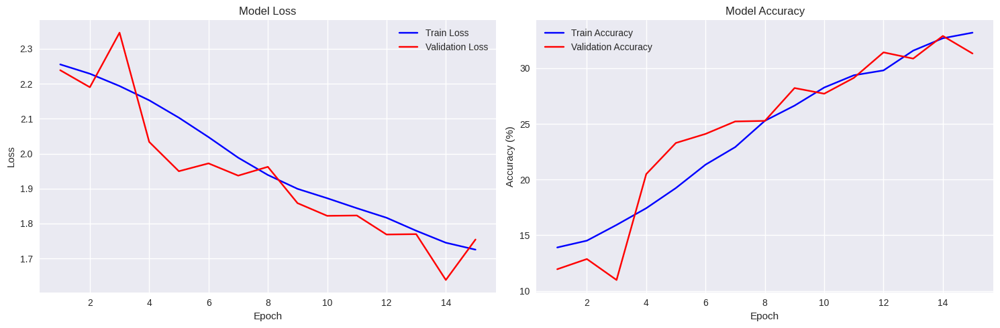


 Eğitim Tamamlandı!
 En İyi Validation Accuracy: 32.89%
 Model kaydedildi: best_visdrone_cnn.pth


In [13]:
# Plot ayarlarplt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print(" VisDrone CNN Model Oluşturma Başlıyor...")
print("=" * 60)

# VisDrone sınıf etiketleri (0: ignored regions hariç)
VISDRONE_CLASSES = {
    1: 'pedestrian',
    2: 'people', 
    3: 'bicycle',
    4: 'car',
    5: 'van',
    6: 'truck',
    7: 'tricycle',
    8: 'awning-tricycle',
    9: 'bus',
    10: 'motor'
}

# Sınıf sayısı
NUM_CLASSES = len(VISDRONE_CLASSES)
CLASS_NAMES = list(VISDRONE_CLASSES.values())

# Device ayarı
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f" Kullanılan Device: {device}")

# DATASET
class VisDroneDatasetForCNN(Dataset):
    """
    VisDrone dataset'ini CNN classification için hazırlayan Dataset sınıfı
    Her görüntüden crop'lar alarak classification problem'ine çeviriyor
    """
    
    def __init__(self, dataset_path, subset='train', transform=None, max_samples_per_class=1000):
        self.dataset_path = Path(dataset_path)
        self.subset = subset
        self.transform = transform
        self.max_samples_per_class = max_samples_per_class
        
        # VisDrone klasör yapısı
        self.subset_paths = {
            "train": {
                "images": self.dataset_path / "VisDrone2019-DET-train" / "VisDrone2019-DET-train" / "images",
                "annotations": self.dataset_path / "VisDrone2019-DET-train" / "VisDrone2019-DET-train" / "annotations"
            },
            "val": {
                "images": self.dataset_path / "VisDrone2019-DET-val" / "VisDrone2019-DET-val" / "images", 
                "annotations": self.dataset_path / "VisDrone2019-DET-val" / "VisDrone2019-DET-val" / "annotations"
            },
            "test": {
                "images": self.dataset_path / "VisDrone2019-DET-test-dev" / "VisDrone2019-DET-test-dev" / "images",
                "annotations": self.dataset_path / "VisDrone2019-DET-test-dev" / "VisDrone2019-DET-test-dev" / "annotations"
            }
        }
        
        self.samples = []
        self.load_dataset()
        
        print(f" {subset.upper()} dataset yüklendi: {len(self.samples)} sample")
        self._print_class_distribution()
    
    def load_annotation(self, annotation_file):
        """VisDrone annotation formatını parse eder"""
        annotations = []
        if not annotation_file.exists():
            return annotations
            
        with annotation_file.open('r') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                    
                parts = line.split(',')
                if len(parts) >= 6:
                    try:
                        x = int(float(parts[0]))
                        y = int(float(parts[1]))  
                        w = int(float(parts[2]))
                        h = int(float(parts[3]))
                        class_id = int(float(parts[5]))
                    except:
                        continue
                        
                    # Ignored regions'ı atla ve geçerli boyutta olan bbox'ları al
                    if class_id > 0 and w > 20 and h > 20:
                        idx = class_id - 1  # 0-indexed yap
                        if 0 <= idx < NUM_CLASSES:
                            annotations.append({
                                'bbox': [x, y, w, h],
                                'class_id': idx,
                                'class_name': VISDRONE_CLASSES[class_id]
                            })
        return annotations
    
    def load_dataset(self):
        """Dataset'i yükler ve her nesne için crop sample'ları oluşturur"""
        paths = self.subset_paths[self.subset]
        img_dir = paths["images"]
        ann_dir = paths["annotations"]
        
        if not img_dir.exists() or not ann_dir.exists():
            print(f" {self.subset} klasörü bulunamadı!")
            return
        
        class_counts = defaultdict(int)
        annotation_files = list(ann_dir.glob('*.txt'))
        random.shuffle(annotation_files)
        
        for ann_file in annotation_files:
            img_file = img_dir / (ann_file.stem + '.jpg')
            if not img_file.exists():
                continue
                
            annotations = self.load_annotation(ann_file)
            for ann in annotations:
                class_id = ann['class_id']
                
                if class_counts[class_id] >= self.max_samples_per_class:
                    continue
                
                self.samples.append({
                    'image_path': str(img_file),
                    'bbox': ann['bbox'],
                    'class_id': class_id,
                    'class_name': ann['class_name']
                })
                class_counts[class_id] += 1
        
        random.shuffle(self.samples)
    
    def _print_class_distribution(self):
        """Sınıf dağılımını yazdır"""
        class_counts = Counter([sample['class_id'] for sample in self.samples])
        print(f"\n {self.subset.upper()} Sınıf Dağılımı:")
        for class_idx, count in sorted(class_counts.items()):
            if 0 <= class_idx < NUM_CLASSES:
                class_name = CLASS_NAMES[class_idx]
                print(f"  {class_name}: {count}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        image = Image.open(sample['image_path']).convert('RGB')
        x, y, w, h = sample['bbox']
        img_width, img_height = image.size
        x = max(0, min(x, img_width - 1))
        y = max(0, min(y, img_height - 1))
        x2 = min(x + w, img_width)
        y2 = min(y + h, img_height)
        cropped_image = image.crop((x, y, x2, y2))
        if cropped_image.size[0] < 32 or cropped_image.size[1] < 32:
            cropped_image = cropped_image.resize((64, 64), Image.LANCZOS)
        if self.transform:
            cropped_image = self.transform(cropped_image)
        return cropped_image, sample['class_id']

# ---------------- MODEL ----------------
class VisDroneCNN(nn.Module):
    def __init__(self, num_classes=NUM_CLASSES, dropout_rate=0.5):
        super(VisDroneCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 5, padding=2)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 64, 5, padding=2)
        self.bn3 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2,2)
        self.conv4 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.conv5 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2,2)
        self.conv6 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(256)
        self.conv7 = nn.Conv2d(256, 256, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(256)
        self.pool4 = nn.MaxPool2d(2,2)
        self.conv8 = nn.Conv2d(256, 512, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(512)
        self.conv9 = nn.Conv2d(512, 512, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(512)
        self.pool5 = nn.MaxPool2d(2,2)
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(dropout_rate)
        self.fc1 = nn.Linear(512, 256)
        self.fc2 = nn.Linear(256, 128)
        self.dropout2 = nn.Dropout(dropout_rate*0.5)
        self.fc3 = nn.Linear(128, num_classes)
    
    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.pool1(x)
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        x = self.pool2(x)
        x = F.relu(self.bn4(self.conv4(x)))
        x = F.relu(self.bn5(self.conv5(x)))
        x = self.pool3(x)
        x = F.relu(self.bn6(self.conv6(x)))
        x = F.relu(self.bn7(self.conv7(x)))
        x = self.pool4(x)
        x = F.relu(self.bn8(self.conv8(x)))
        x = F.relu(self.bn9(self.conv9(x)))
        x = self.pool5(x)
        x = self.global_avg_pool(x)
        x = torch.flatten(x,1)
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = self.dropout2(x)
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# ---------------- TRAINER ----------------
class ModelTrainer:
    def __init__(self, model, device):
        self.model = model.to(device)
        self.device = device
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []
    
    def train_epoch(self, train_loader, optimizer, criterion):
        """Bir epoch için eğitim"""
        self.model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.to(self.device), target.to(self.device)
            optimizer.zero_grad()
            output = self.model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(output.data, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = 100. * correct / total
        return epoch_loss, epoch_acc
    
    def validate(self, val_loader, criterion):
        """Validation"""
        self.model.eval()
        val_loss = 0
        correct = 0
        total = 0
        
        with torch.no_grad():
            for data, target in val_loader:
                data, target = data.to(self.device), target.to(self.device)
                output = self.model(data)
                val_loss += criterion(output, target).item()
                _, predicted = torch.max(output.data, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()
        
        val_loss /= len(val_loader)
        val_acc = 100. * correct / total
        return val_loss, val_acc
    
    def train_model(self, train_loader, val_loader, epochs, learning_rate=0.001):
        """Ana eğitim döngüsü"""
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(self.model.parameters(), lr=learning_rate, weight_decay=1e-4)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)
        
        print(f"\n Model Eğitimi Başlıyor - {epochs} Epoch")
        print("=" * 50)
        
        best_val_acc = 0
        
        for epoch in range(epochs):
            print(f'\nEpoch [{epoch+1}/{epochs}]')
            print('-' * 30)
            
            train_loss, train_acc = self.train_epoch(train_loader, optimizer, criterion)
            val_loss, val_acc = self.validate(val_loader, criterion)
            scheduler.step(val_loss)
            
            self.train_losses.append(train_loss)
            self.train_accuracies.append(train_acc)
            self.val_losses.append(val_loss)
            self.val_accuracies.append(val_acc)
            
            print(f'Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%')
            print(f'Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%')
            print(f'LR: {optimizer.param_groups[0]["lr"]:.6f}')
            
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                torch.save(self.model.state_dict(), 'best_visdrone_cnn.pth')
                print(f'🎯 Yeni en iyi model kaydedildi! Val Acc: {val_acc:.2f}%')
        
        print(f"\n Eğitim tamamlandı! En iyi Validation Accuracy: {best_val_acc:.2f}%")
        return best_val_acc
    
    def plot_training_history(self):
        """Eğitim geçmişini görselleştir"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        epochs = range(1, len(self.train_losses)+1)
        ax1.plot(epochs, self.train_losses, 'b-', label='Train Loss')
        ax1.plot(epochs, self.val_losses, 'r-', label='Validation Loss')
        ax1.set_title('Model Loss')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.legend()
        ax1.grid(True)
        
        ax2.plot(epochs, self.train_accuracies, 'b-', label='Train Accuracy')
        ax2.plot(epochs, self.val_accuracies, 'r-', label='Validation Accuracy')
        ax2.set_title('Model Accuracy')
        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('Accuracy (%)')
        ax2.legend()
        ax2.grid(True)
        
        plt.tight_layout()
        plt.show()

#DATA TRANSFORMS 
def create_data_transforms():
    """Veri transform'larını oluştur"""
    train_transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomRotation(15),
        transforms.RandomHorizontalFlip(0.5),
        transforms.RandomVerticalFlip(0.3),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.RandomApply([transforms.GaussianBlur(3)], p=0.2),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
    ])
    
    val_transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
    ])
    
    return train_transform, val_transform

# MODEL ANALYSIS 
def analyze_model_architecture(model):
    print("\n MODEL MİMARİSİ ANALİZİ")
    print("="*50)
    try:
        summary(model, (3,224,224))
    except:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        print(f" Toplam Parametre: {total_params:,}")
        print(f" Eğitilebilir Parametre: {trainable_params:,}")
        print(f" Model Boyutu: ~{total_params*4/1024/1024:.2f} MB")

# MAIN PIPELINE 
def main_training_pipeline(dataset_path, epochs=20, batch_size=32, learning_rate=0.001):
    print(" VisDrone CNN Eğitim Pipeline'ı Başlıyor")
    print("="*60)
    
    train_transform, val_transform = create_data_transforms()
    
    train_dataset = VisDroneDatasetForCNN(dataset_path, subset='train', transform=train_transform, max_samples_per_class=800)
    val_dataset = VisDroneDatasetForCNN(dataset_path, subset='val', transform=val_transform, max_samples_per_class=200)
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    
    print(f" Train batches: {len(train_loader)}")
    print(f" Val batches: {len(val_loader)}")
    
    model = VisDroneCNN(num_classes=NUM_CLASSES, dropout_rate=0.5)
    analyze_model_architecture(model)
    
    trainer = ModelTrainer(model, device)
    best_acc = trainer.train_model(train_loader, val_loader, epochs=epochs, learning_rate=learning_rate)
    trainer.plot_training_history()
    
    return model, trainer, best_acc

# kullan
if __name__ == "__main__":
    DATASET_PATH = "/kaggle/input/visdrone-dataset"
    EPOCHS = 15
    BATCH_SIZE = 32
    LEARNING_RATE = 0.001
    
    model, trainer, best_accuracy = main_training_pipeline(DATASET_PATH, epochs=EPOCHS, batch_size=BATCH_SIZE, learning_rate=LEARNING_RATE)
    
    print(f"\n Eğitim Tamamlandı!")
    print(f" En İyi Validation Accuracy: {best_accuracy:.2f}%")
    print(f" Model kaydedildi: best_visdrone_cnn.pth")

# Model Değerlendirme

### Model Değerlendirme ve Grad-CAM Görselleştirmesi

Bu hücre, **eğitilmiş CNN modelini test verisi üzerinde değerlendirir** ve Grad-CAM ile sınıflandırma kararlarını görselleştirir.

---

#### 1. Model Değerlendirme (`evaluate_model`)
- **Test seti üzerinde tahminler** yapılır ve gerçek etiketlerle karşılaştırılır.
- `classification_report` ile her sınıf için **precision, recall ve f1-score** hesaplanır.
- `confusion_matrix` kullanılarak **sınıf bazlı tahmin hataları** ısı haritası şeklinde görselleştirilir.
- Global `CLASS_NAMES` kullanılarak sınıf isimleri grafiklerde ve raporda gösterilir.

> Örnek Çıktı:
> - VAL setinde 1967 sample
> - Accuracy: %35 (bu model için başlangıç aşamasında düşük, ileri optimizasyon gerekebilir)
> - Sınıflara göre performans farkları gözlemlenebilir (örneğin `bus` sınıfı yüksek recall, `truck` düşük recall).

---

#### 2. Grad-CAM Görselleştirmesi (`gradcam_visualize`)
- Modelin **hangi bölgelerden sınıf kararını etkilediğini** gösterir.
- `GradCAM` ile son konvolüsyon katmanından aktivasyon haritası çıkarılır.
- Aktivasyon haritası, orijinal görüntü üzerine **yarı saydam renk maskesi** olarak eklenir.
- Tahmin edilen ve gerçek sınıf isimleri başlıkta gösterilir.

> Kullanım örneği:  
> ```python
> for idx in [0, 10, 20]:
>     gradcam_visualize(model, test_dataset, idx=idx, device=device)
> ```

---

#### 3. Test Pipeline
1. `VisDroneCNN` modeli yüklenir ve en iyi ağırlıklar (`best_visdrone_cnn.pth`) uygulanır.
2. Test/validation dataset hazırlanır.
3. `evaluate_model` çağrılarak performans metrikleri ve confusion matrix çizilir.
4. Örnek görüntüler üzerinde Grad-CAM ile **modelin dikkat ettiği bölgeler** görselleştirilir.

---

Bu analiz, modelin hem **nicel performansını** hem de **görsel olarak hangi özellikleri öğrendiğini** anlamamıza yardımcı olur.  

- **Sınıf dengesizliği ve düşük doğruluk**, veri augmentasyonu, hiperparametre optimizasyonu veya model derinliğinin artırılmasıyla iyileştirilebilir.


### Confusion Matrix (Karmaşıklık Matrisi)

Confusion matrix, bir sınıflandırma modelinin **gerçek etiketler ile tahmin edilen etiketler** arasındaki ilişkiyi tablo şeklinde gösterir.  

#### Matrisin Yapısı
- **Satırlar (Rows):** Gerçek sınıflar (Actual / True)
- **Sütunlar (Columns):** Modelin tahmin ettiği sınıflar (Predicted)
- **Her hücre (i, j):** Gerçek sınıf `i` iken modelin `j` sınıfını tahmin etme sayısı

tablo formatı:

|        | Pred: Pedestrian | Pred: People | ... | Pred: Motor |
|--------|-----------------|--------------|-----|-------------|
| True: Pedestrian | 88              | 45           | ... | 2           |
| True: People     | 30              | 85           | ... | 5           |
| ...              | ...             | ...          | ... | ...         |
| True: Motor      | 20              | 15           | ... | 40          |

--- 

#### Matristeki Kavramlar
1. **Doğru Pozitif (TP):**  
   - Satır ve sütun aynı sınıf olduğunda (örneğin `Pedestrian` satırı, `Pedestrian` sütunu)  
   - Model doğru tahmin etmiş demektir.

2. **Yanlış Pozitif (FP):**  
   - Sütunda farklı sınıf varsa (örneğin `People` tahmin edilmiş ama gerçek `Pedestrian`)  
   - Model yanlış tahmin yapmış demektir.

3. **Yanlış Negatif (FN):**  
   - Satırda farklı sütun varsa (örneğin gerçek `Bus` ama model `Truck` demiş)  
   - Model bir nesneyi yanlış sınıflandırmış demektir.

4. **Doğru Negatif (TN):**  
   - Sınıfın dışında kalan tüm doğru tahminler (genellikle çok sınıflı problemde satır-sütun çaprazı dışında kalanlar)


#### Nasıl Yorumlayabiliriz?
- **Diyagonal hücreler:** Doğru sınıflandırmalar (ne kadar büyükse o sınıfta model o kadar başarılı)
- **Diyagonal dışındaki hücreler:** Yanlış sınıflandırmalar
- Örneğin `bus` sınıfının satırında yüksek bir değer `car` sütununda varsa, model otobüsleri yanlışlıkla araba olarak sınıflandırmış demektir.
- Matrisi heatmap ile görselleştirince:
  - **Koyu renkler:** Daha yüksek sayıları gösterir.
  - Hızlı görsel olarak hangi sınıflarda hataların yoğunlaştığını anlamak mümkün olur.


#### Özet
- Confusion matrix, modelin **hangi sınıflarda güçlü veya zayıf olduğunu** net bir şekilde gösterir.
- Sınıf dengesizliği, model mimarisi veya veri augmentasyonu ihtiyacını belirlemek için kullanılır.
- Grad-CAM ile birlikte kullanıldığında, **hem nicel hem de görsel olarak modelin karar mekanizmasını anlamamıza** yardımcı olur.


 VAL dataset yüklendi: 1967 sample

 VAL Sınıf Dağılımı:
  pedestrian: 200
  people: 200
  bicycle: 200
  car: 200
  van: 200
  truck: 200
  tricycle: 200
  awning-tricycle: 200
  bus: 167
  motor: 200

 Classification Report
                 precision    recall  f1-score   support

     pedestrian       0.44      0.89      0.59       200
         people       0.26      0.12      0.16       200
        bicycle       0.41      0.52      0.46       200
            car       0.34      0.15      0.21       200
            van       0.29      0.56      0.38       200
          truck       0.22      0.12      0.16       200
       tricycle       0.28      0.04      0.07       200
awning-tricycle       0.20      0.43      0.27       200
            bus       0.40      0.29      0.34       167
          motor       0.37      0.07      0.11       200

       accuracy                           0.32      1967
      macro avg       0.32      0.32      0.28      1967
   weighted avg       0.32     

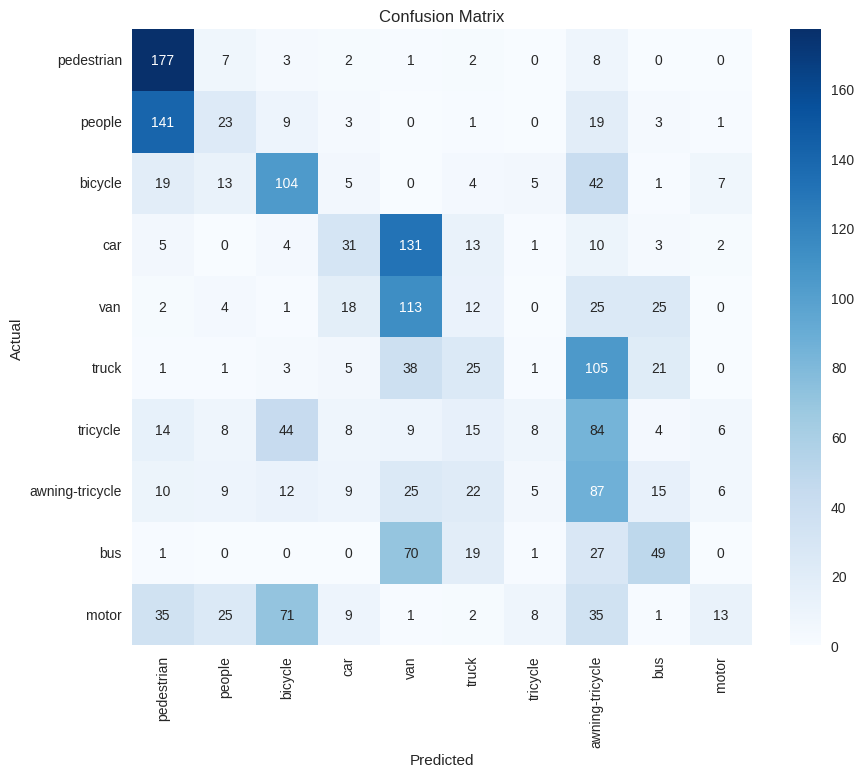

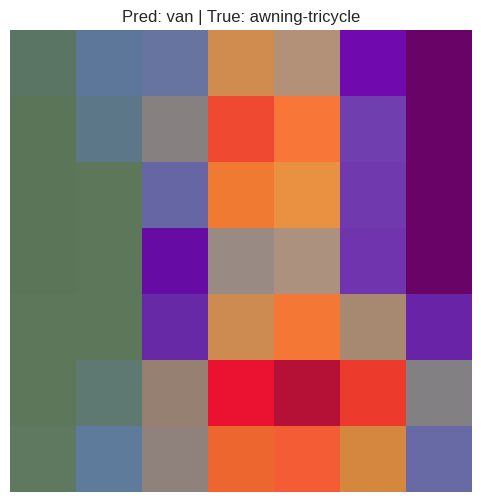

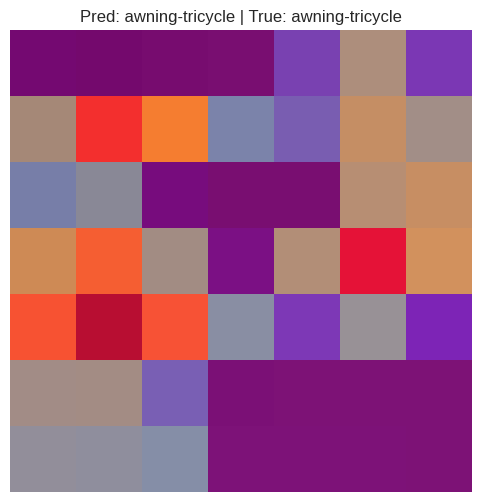

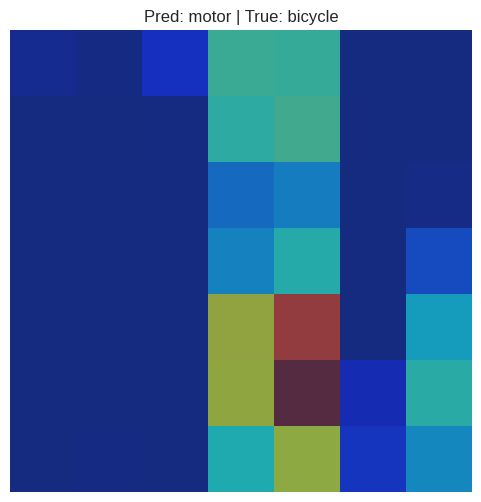

In [14]:
def evaluate_model(model, test_dataset, batch_size=32, device='cuda'):
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    model.eval()
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
    
    print("\n Classification Report")
    print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES))  # globak

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10,8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()


# GRAD-CAM VISUALIZATION 
def gradcam_visualize(model, dataset, idx=0, device='cuda'):
    model.eval()
    cam_extractor = GradCAM(model, target_layer='conv9')  # son conv layer
    image, label = dataset[idx]
    input_tensor = image.unsqueeze(0).to(device)
    
    out = model(input_tensor)
    pred_class = out.argmax(dim=1).item()
    
    # Grad-CAM mask
    activation_map = cam_extractor(pred_class, out)
    activation_map = activation_map[0].squeeze().cpu().numpy()
    
    # Görselleştirme
    img = ToPILImage()(image)
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.imshow(activation_map, cmap='jet', alpha=0.5)
    # Burada global CLASS_NAMES kullanıyoruz
    plt.title(f"Pred: {CLASS_NAMES[pred_class]} | True: {CLASS_NAMES[label]}")
    plt.axis('off')
    plt.show()


# TEST PIPELINE 
if __name__ == "__main__":
    # Model ve dataset yükle
    model = VisDroneCNN(num_classes=NUM_CLASSES)
    model.load_state_dict(torch.load('best_visdrone_cnn.pth'))
    model.to(device)
    
    test_transform = create_data_transforms()[1]  # validation transform
    test_dataset = VisDroneDatasetForCNN(DATASET_PATH, subset='val', transform=test_transform, max_samples_per_class=200)
    
    evaluate_model(model, test_dataset, batch_size=32, device=device)
    
    # Örnek Grad-CAM görselleştirmeleri
    for idx in [0, 10, 20]:
        gradcam_visualize(model, test_dataset, idx=idx, device=device)


> - Toplam 15 epoch boyunca eğitim ve doğrulama verileri kaydedilmiş.
> - Eğitim ve doğrulama metriklerinin eşit sayıda olması, eğitim sürecinin eksiksiz tamamlandığını gösterir.
> Bu durumda:
> - Eğitim ve doğrulama epoch sayısı eşit (15)
> - Bundan sonraki adım, **loss ve accuracy grafikleri** üzerinden overfitting durumunu görselleştirip yorumlamaktır.

In [15]:
print(len(trainer.train_losses), len(trainer.val_losses))
print(len(trainer.train_accuracies), len(trainer.val_accuracies))


15 15
15 15


### Hızlı Overfitting / Underfitting Analizi

Bu hücre, **eğitim ve doğrulama kaybı ve doğruluk eğrilerini** hızlıca görselleştirerek modelin overfitting veya underfitting durumunu değerlendirir.

---

#### Yapılanlar:

1. **Loss ve Accuracy Grafikleri**
   - `train_losses` ve `val_losses` ile eğitim ve doğrulama kayıpları çizilir.
   - `train_accuracies` ve `val_accuracies` ile doğruluk eğrileri çizilir.
   - `plt.savefig` ile grafikler `overfitting_analysis.png` olarak kaydedilir.
   - `plt.show()` ile Jupyter Notebook üzerinde inline olarak gösterilir.

2. **Hızlı Yorum**
   - Eğer **eğitim loss düşük**, **validation loss yüksek** ve **eğitim doğruluğu validation doğruluğundan ≥5% fazla** ise:
     - Model **overfitting yapıyor** demektir.
   - Eğer **eğitim loss yüksek**, validation loss daha düşükse:
     - Model **underfitting** durumunda.
   - Diğer durumlarda:
     - Model **dengeli**, overfitting/underfitting gözlemlenmiyor.


Bu fonksiyon, modelin performans eğrilerini hızlıca yorumlamamızı sağlar ve gerekirse augmentation, dropout veya erken durdurma gibi önlemler alınmasına karar 
vermemize yardımcı olur.

---

#### Kullanım 
```python
check_overfitting_fast(trainer)


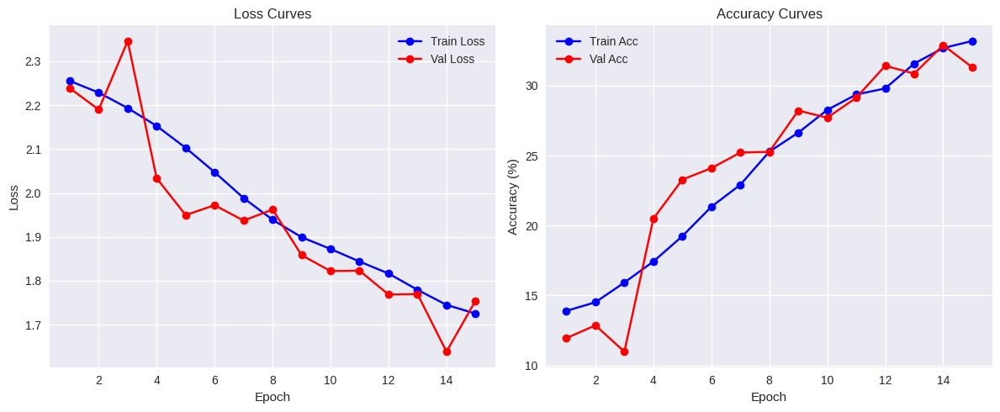


📌 Overfitting / Underfitting Analizi:
 Model dengeli görünüyor: Overfitting/underfitting gözlenmiyor.


In [16]:
def check_overfitting_fast(trainer):
    train_losses = trainer.train_losses
    val_losses = trainer.val_losses
    train_acc = trainer.train_accuracies
    val_acc = trainer.val_accuracies
    epochs = range(1, len(train_losses)+1)

    # Grafikleri kaydet ve göster 
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))

    ax1.plot(epochs, train_losses, 'b-o', label='Train Loss')
    ax1.plot(epochs, val_losses, 'r-o', label='Val Loss')
    ax1.set_title('Loss Curves')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    ax2.plot(epochs, train_acc, 'b-o', label='Train Acc')
    ax2.plot(epochs, val_acc, 'r-o', label='Val Acc')
    ax2.set_title('Accuracy Curves')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.savefig("overfitting_analysis.png")  # Grafikleri kaydet
    plt.show()  # Inline göster

    # yorum
    print("\n📌 Overfitting / Underfitting Analizi:")
    if train_losses[-1] < val_losses[-1] and train_acc[-1] > val_acc[-1] + 5:
        print(" Model overfitting yapıyor: Eğitim loss düşük, validation loss yüksek.")
    elif train_losses[-1] > val_losses[-1]:
        print(" Model underfitting yapıyor: Eğitim loss hâlâ yüksek.")
    else:
        print(" Model dengeli görünüyor: Overfitting/underfitting gözlenmiyor.")

# Kullanımı
check_overfitting_fast(trainer)


# HİPERPARAMETRE OPTİMİZASYONU
### Optimizer Karşılaştırması

Bu hücre, **farklı optimizasyon algoritmalarının** modelin doğrulama performansı üzerindeki etkisini hızlıca test eder.

---

#### 1. Kullanılan Optimizerlar
- **Adam**: Adaptif learning rate ile hızlı yakınsama sağlar, genellikle iyi performans verir.
- **RMSprop**: Momentum ve adaptif learning rate ile özellikle sıralı/veri yoğun görevlerde iyidir.
- **SGD + Momentum**: Standart stochastic gradient descent, momentum ile öğrenmeyi hızlandırır.

---

#### 2. Pipeline
1. `train_dataset` ve `val_dataset` hazırlanır (küçük epoch ve batch ile hızlı test).
2. Her optimizer için:
   - Model sıfırdan oluşturulur.
   - Eğitim yapılır (5 epoch).
   - Validation seti üzerinde accuracy hesaplanır.
3. Sonuçlar `results` sözlüğünde saklanır ve bar grafiği ile görselleştirilir.

---

#### 3. Sonuçlar
| Optimizer | Validation Accuracy |
|-----------|-------------------|
| Adam      | 0.2598            |
| RMSprop   | 0.2201            |
| SGD       | 0.3503            |

- Bu testte **SGD + Momentum**, diğer optimizere göre daha yüksek doğrulama accuracy sağladı.
- Daha uzun eğitim ve hiperparametre optimizasyonu ile sonuçlar değişebilir.

---

#### 4. Görselleştirme
- Bar grafiği ile her optimizerın doğrulama performansı karşılaştırılır.
- Grafikte her barın üzerinde doğruluk yüzdesi gösterilir, hızlı bir görsel özet sağlar.

> 🔹 Bu analiz, model eğitimi sırasında **hangi optimizer ile daha iyi genel performans** elde edileceğini belirlemek için kullanışlıdır.


 TRAIN dataset yüklendi: 8000 sample

 TRAIN Sınıf Dağılımı:
  pedestrian: 800
  people: 800
  bicycle: 800
  car: 800
  van: 800
  truck: 800
  tricycle: 800
  awning-tricycle: 800
  bus: 800
  motor: 800
 VAL dataset yüklendi: 1967 sample

 VAL Sınıf Dağılımı:
  pedestrian: 200
  people: 200
  bicycle: 200
  car: 200
  van: 200
  truck: 200
  tricycle: 200
  awning-tricycle: 200
  bus: 167
  motor: 200

 Adam ile eğitim başlıyor...
 Adam Validation Accuracy: 0.2084

 RMSprop ile eğitim başlıyor...
 RMSprop Validation Accuracy: 0.2471

 SGD ile eğitim başlıyor...
 SGD Validation Accuracy: 0.2933


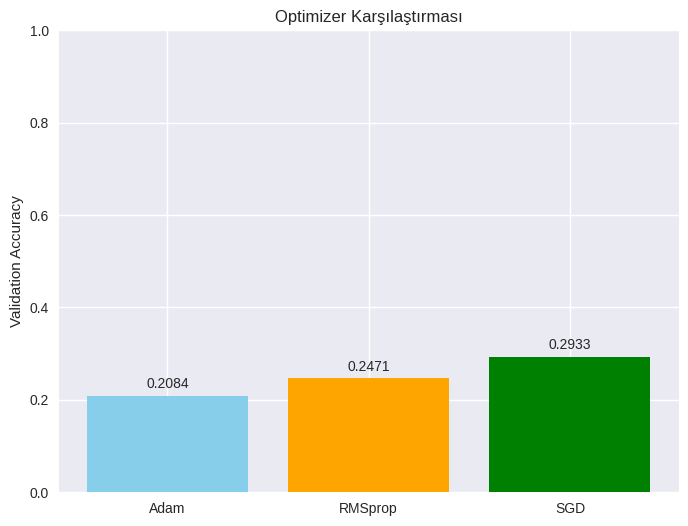

In [17]:
# Optimizer karşılaştırması için parametreler
optimizers_dict = {
    'Adam': lambda params: optim.Adam(params, lr=1e-3),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3),
    'SGD': lambda params: optim.SGD(params, lr=1e-2, momentum=0.9)
}

results = {}

# Dataset ve DataLoader
train_transform, val_transform = create_data_transforms()
train_dataset = VisDroneDatasetForCNN(DATASET_PATH, subset='train', transform=train_transform, max_samples_per_class=800)
val_dataset = VisDroneDatasetForCNN(DATASET_PATH, subset='val', transform=val_transform, max_samples_per_class=200)

# Küçük batch ve epoch ile hızlı test
batch_size = 32
epochs = 5

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Optimizer karşılaştırması
for opt_name, opt_func in optimizers_dict.items():
    print(f"\n {opt_name} ile eğitim başlıyor...")
    
    # Modeli baştan oluştur
    model = VisDroneCNN(num_classes=NUM_CLASSES, dropout_rate=0.5).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = opt_func(model.parameters())
    
    # Hızlı eğitim döngüsü
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0, 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    
    # Validation
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs,1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    
    val_acc = correct / total
    results[opt_name] = val_acc
    print(f" {opt_name} Validation Accuracy: {val_acc:.4f}")

# ---------- Sonuçları görselleştir ----------
plt.figure(figsize=(8,6))
bars = plt.bar(results.keys(), results.values(), color=['skyblue','orange','green'])
plt.title("Optimizer Karşılaştırması")
plt.ylabel("Validation Accuracy")
plt.ylim(0,1)

for bar, acc in zip(bars, results.values()):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()+0.01,
             f"{acc:.4f}", ha='center', va='bottom')

plt.show()


# Transfer Learning
### Transfer Learning ile ResNet50 Eğitimi

Bu hücre, **önceden eğitilmiş ResNet50 modeli** kullanarak VisDrone veri seti üzerinde transfer learning uygulanmasını içerir.


#### 1. Data Transformasyonları
- **Eğitim için:** Resize, Random Horizontal Flip, Random Rotation, Color Jitter, Normalize
- **Validation için:** Resize, Normalize
- Amaç: Modelin **daha iyi genellemesi ve overfitting riskinin azaltılması**


#### 2. Dataset ve DataLoader
- `VisDroneDatasetForCNN` ile train ve validation setleri hazırlanır.
- Her sınıftan maksimum örnek sayısı belirlenir (`max_samples_per_class`).
- `DataLoader` ile batch halinde eğitim ve doğrulama sağlanır.


#### 3. Model Yapısı
- **ResNet50** önceden eğitilmiş ağırlıklarla yüklenir.
- Son fully connected (fc) katmanı, VisDrone sınıf sayısına (`NUM_CLASSES`) göre yeniden tanımlanır.
- **Feature Extraction yaklaşımı:**
  - Tüm konvolüsyon katmanları **freeze** edilir.
  - Sadece son katman **eğitilir**.


#### 4. Loss ve Optimizer
- Loss: `CrossEntropyLoss`
- Optimizer: `Adam`, sadece fc katmanı parametreleri optimize edilir, lr = 1e-3


#### 5. Eğitim Döngüsü
- `num_epochs = 10`
- Her epoch için:
  1. Eğitim kaybı ve doğruluğu hesaplanır.
  2. Validation kaybı ve doğruluğu hesaplanır.
- Her epoch sonunda eğitim ve doğrulama performansı loglanır.

#### Görselleştirme

Epoch bazlı loss ve accuracy eğrileri çizilir.

Böylece modelin eğitim ve doğrulama performansı görsel olarak takip edilir.

Düşük epoch sayısı ve sınırlı eğitim verisi ile elde edilen doğruluk, modelin ileri optimizasyon veya fine-tuning ile artırılabileceğini gösterir.

#### Model Kaydetme
```python
torch.save(model.state_dict(), 'visdrone_resnet50_transfer.pth')



 TRAIN dataset yüklendi: 8000 sample

 TRAIN Sınıf Dağılımı:
  pedestrian: 800
  people: 800
  bicycle: 800
  car: 800
  van: 800
  truck: 800
  tricycle: 800
  awning-tricycle: 800
  bus: 800
  motor: 800
 VAL dataset yüklendi: 1967 sample

 VAL Sınıf Dağılımı:
  pedestrian: 200
  people: 200
  bicycle: 200
  car: 200
  van: 200
  truck: 200
  tricycle: 200
  awning-tricycle: 200
  bus: 167
  motor: 200


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 172MB/s]


Epoch [1/10] - Train Loss: 1.8794 | Train Acc: 31.01% | Val Loss: 1.5847 | Val Acc: 42.91%
Epoch [2/10] - Train Loss: 1.6479 | Train Acc: 40.88% | Val Loss: 1.5951 | Val Acc: 41.54%
Epoch [3/10] - Train Loss: 1.5785 | Train Acc: 42.99% | Val Loss: 1.6322 | Val Acc: 40.57%
Epoch [4/10] - Train Loss: 1.5472 | Train Acc: 43.75% | Val Loss: 1.7404 | Val Acc: 39.30%
Epoch [5/10] - Train Loss: 1.5027 | Train Acc: 45.20% | Val Loss: 1.6299 | Val Acc: 40.47%
Epoch [6/10] - Train Loss: 1.4883 | Train Acc: 46.85% | Val Loss: 1.6819 | Val Acc: 40.67%
Epoch [7/10] - Train Loss: 1.4831 | Train Acc: 45.88% | Val Loss: 1.5049 | Val Acc: 44.89%
Epoch [8/10] - Train Loss: 1.4725 | Train Acc: 46.71% | Val Loss: 1.4819 | Val Acc: 45.96%
Epoch [9/10] - Train Loss: 1.4660 | Train Acc: 47.33% | Val Loss: 1.6111 | Val Acc: 42.76%
Epoch [10/10] - Train Loss: 1.4730 | Train Acc: 47.36% | Val Loss: 1.5728 | Val Acc: 43.98%
 Transfer Learning modeli kaydedildi: visdrone_resnet50_transfer.pth


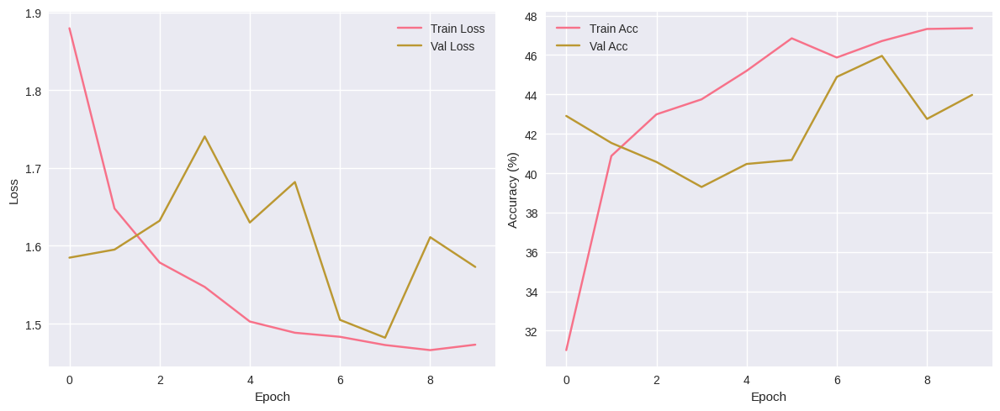

In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# data transformers
train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(0.2,0.2,0.2,0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])


train_dataset = VisDroneDatasetForCNN(DATASET_PATH, subset='train', transform=train_transform, max_samples_per_class=800)
val_dataset = VisDroneDatasetForCNN(DATASET_PATH, subset='val', transform=val_transform, max_samples_per_class=200)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)

# model
model = models.resnet50(pretrained=True)  # önceden eğitilmiş ResNet50
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, NUM_CLASSES)  # son katman sınıf sayısına göre

# Feature Extraction: tüm conv katmanları freeze et
for param in model.parameters():
    param.requires_grad = False
# Son katmanın eğitilebilir olmasını sağla
for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

# loss optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=1e-3)

# training
num_epochs = 10
train_losses, val_losses = [], []
train_accs, val_accs = [], []

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0, 0, 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, preds = torch.max(outputs,1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    
    train_losses.append(running_loss/len(train_loader))
    train_accs.append(100*correct/total)
    
    # Validation
    model.eval()
    val_loss, correct, total = 0,0,0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs,1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    val_losses.append(val_loss/len(val_loader))
    val_accs.append(100*correct/total)
    
    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {train_losses[-1]:.4f} | Train Acc: {train_accs[-1]:.2f}% | Val Loss: {val_losses[-1]:.4f} | Val Acc: {val_accs[-1]:.2f}%")

# modeli kaydet
torch.save(model.state_dict(), 'visdrone_resnet50_transfer.pth')
print(" Transfer Learning modeli kaydedildi: visdrone_resnet50_transfer.pth")

# görselleştirme
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(range(num_epochs), train_losses, label='Train Loss')
plt.plot(range(num_epochs), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(range(num_epochs), train_accs, label='Train Acc')
plt.plot(range(num_epochs), val_accs, label='Val Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


### Overfitting / Underfitting Analizi (Resnet50)

Bu hücre, eğitim ve doğrulama **loss** ve **accuracy** listelerini kullanarak:

1. Epoch bazlı performans grafikleri çizer.
2. Modelin overfitting veya underfitting yapıp yapmadığını hızlıca yorumlar.

---

#### 1. Grafikleri Çizme
- **Loss Curves:** Eğitim ve doğrulama kaybı karşılaştırılır.
- **Accuracy Curves:** Eğitim ve doğrulama doğruluğu karşılaştırılır.
- Amaç: Modelin performans eğrilerini görsel olarak incelemek.

---

- **Overfitting:** 
  - Eğitim loss düşük, validation loss yüksek
  - Eğitim doğruluğu validation doğruluğundan ≥5% yüksek
  - Öneriler: Dropout ekleme, L2 regularization, veri augmentasyonu
- **Underfitting:**
  - Eğitim loss yüksek, validation loss daha düşük
  - Öneriler: Daha derin model, learning rate veya epoch sayısını artırma
- **Dengeli model:** 
  - Hem eğitim hem validation loss ve accuracy yakın
  - Overfitting/underfitting gözlemlenmez




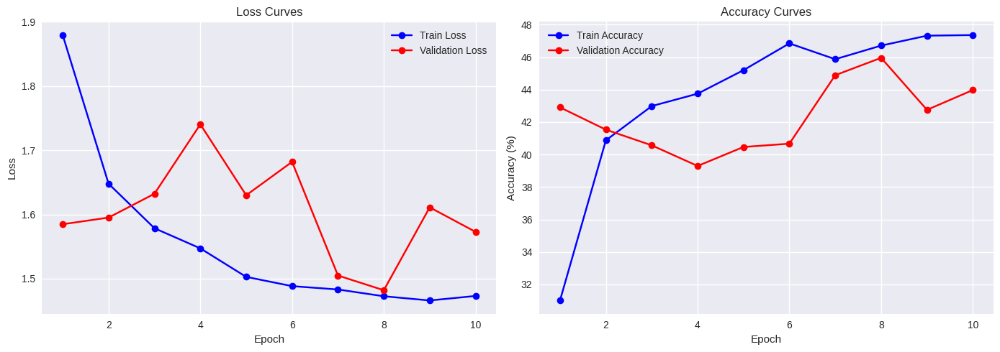


📌 Overfitting / Underfitting Analizi:
 Model dengeli görünüyor: Overfitting/underfitting gözlenmiyor.


In [19]:
def analyze_overfitting_from_lists(train_losses, val_losses, train_accs, val_accs):
    """
    Train/val loss ve accuracy listelerini alır,
    grafik çizer ve overfitting/underfitting yorumunu yapar.
    """
    epochs = range(1, len(train_losses)+1)
    
    # grafikler
    plt.figure(figsize=(14,5))
    
    # Loss
    plt.subplot(1,2,1)
    plt.plot(epochs, train_losses, 'b-o', label='Train Loss')
    plt.plot(epochs, val_losses, 'r-o', label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curves')
    plt.legend()
    plt.grid(True)
    
    # Accuracy
    plt.subplot(1,2,2)
    plt.plot(epochs, train_accs, 'b-o', label='Train Accuracy')
    plt.plot(epochs, val_accs, 'r-o', label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title('Accuracy Curves')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # yorum kısmı
    final_train_loss = train_losses[-1]
    final_val_loss = val_losses[-1]
    final_train_acc = train_accs[-1]
    final_val_acc = val_accs[-1]

    print("\n📌 Overfitting / Underfitting Analizi:")
    if final_train_loss < final_val_loss and final_train_acc > final_val_acc + 5:
        print(" Model overfitting yapıyor: Eğitim loss düşük, validation loss yüksek.")
        print(" Öneriler: Dropout ekle, L2 regularization uygula, veri arttırma yap.")
    elif final_train_loss > final_val_loss:
        print(" Model underfitting yapıyor: Eğitim loss hâlâ yüksek.")
        print(" Öneriler: Daha derin model veya learning rate/epoch sayısını gözden geçir.")
    else:
        print(" Model dengeli görünüyor: Overfitting/underfitting gözlenmiyor.")

# kyllanım
analyze_overfitting_from_lists(train_losses, val_losses, train_accs, val_accs)


### Gelecek Geliştirmeler ve End-to-End Drone Detection Projesi

Bu proje, şimdilik **Crop → Classify** yaklaşımıyla çalışıyor. Ancak ileride proje, gerçek hayata entegre ve profesyonel bir drone nesne tespit sistemine dönüştürülebilir. İşte planlanan geliştirmeler ve ek özellikler:

---

#### 1️⃣ Gerçek Object Detection
- **Mevcut:** Crop → Classify
- **Gelişmiş:** YOLOv8, Faster R-CNN, SSD veya Detectron2 kullanarak doğrudan **tam görüntüden nesne tespiti** yapılacak.
- **Girdi:** Tam drone görüntüsü
- **Çıktı:** Bounding box + class + confidence
- **Avantaj:** Model, nesneleri doğrudan tespit eder ve sınıfları ayırırken insan müdahalesine gerek kalmaz.

---

#### 2️⃣ Tracking (Takip)
- Drone görüntüleri genellikle video serisi içerir.
- **DeepSORT / ByteTrack** entegrasyonu ile:
  - Nesneleri frame’ler arasında takip et
  - ID ataması yap
- **Artı:** “Bu nesne önce nerede, sonra nerede” diyerek hareket analizi yapılabilir.

---

#### 3️⃣ Confidence & Prediction Visuals
- Tespit edilen nesneler için:
  - Confidence threshold gösterimi
  - Top-N tahminler görselleştirme
  - Heatmap veya Grad-CAM overlay ile modelin hangi bölgeleri dikkate aldığını gösterme

---

#### 4️⃣ Video Demo / Simülasyon
- Drone görüntülerini **video input** olarak kullan
- Modelin nesneleri **anlık tespitini video üzerinde göster**
- Kaggle / Colab veya lokal demo olarak sunulabilir
- “Realtime Drone Object Detection” görselleştirmesi etkileyici bir kullanıcı deneyimi sağlar.

---

#### 5️⃣ Ekstralar
- **Augmented Reality Overlay:** Tespit edilen nesnelerin üzerine bilgi etiketleri ekle (mesafe, hız, sınıf)
- **Anomali / Tehlike Tespiti:** Kalabalık alan, araç yığılması veya tehlikeli durumlar
- **Web Dashboard:** React + FastAPI ile drone görüntüsünü anlık yükle, tespit ve istatistikleri gör
- **Hız ve Performans Analizi:** FPS, inference time, IoU skorları gibi detaylı metrikler sun

---

#### 6️⃣ Yapay Zeka Entegrasyonu
- **Anomali / Tehlike Tespiti:** AI ile kalabalık, trafik veya yasak bölge gibi durumları otomatik tespit et
- **Hareket ve Aktivite Analizi:** Tracking ile nesne hareketlerini sınıflandır ve anormal paternleri belirle
- **Otomatik Raporlama & Öneri Sistemi:** AI, risk skorları üretir, uyarılar verir ve özet raporlar oluşturur
- **Decision Support:** Drone verilerini analiz ederek operatör için öneriler sunar
- **Görselleştirme + AI:** Heatmap, bounding box ve CAM overlay ile AI tahminleri görselleştirilir, AR ile bilgi etiketleri eklenir

---

#### 7️⃣ Teknikler
- Veri önişleme tekniklerinin artırılması (daha fazla augmentasyon, noise, blur, lighting değişiklikleri)
- Hiperparametre optimizasyonunun genişletilmesi (learning rate, dropout, batch size, layer sayısı)
- Farklı modellerin denenmesi ve karşılaştırılması (ResNet, EfficientNet, MobileNet vb.)
- Overfitting ve underfitting kontrolü için gelişmiş izleme ve regularization teknikleri
- Gerçek zamanlı veri akışı ile online learning veya adaptive learning entegrasyonu

---
